In [1]:
library(dplyr)
library(Seurat)
library(DropletUtils)  
library(celldex)
library(SingleR)
library(ggplot2)
library(patchwork)
library(tidyverse)
library(Seurat)
library(SeuratData)
library(SeuratDisk)
library('CellMixS')
library(vegan)
library(dplyr)
library(data.table)
library(harmony)
library(djvdj)
library(scRepertoire)
library(destiny)
library(scbp)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads

In [2]:
pat_list <- c('Sarcoma167GEX', 'Sarcoma322GEX', 'Sarcoma559GEX',
              'Sarcoma708GEX', 'SarcomaS408GEX', 'SarcomaS410GEX', 
              'SarcomaS914GEX', 'SarcomaS956GEX' )

object.list <- lapply(pat_list, function (x) readRDS(paste0('../data/', x, "/data_", x, "_annotated_numbat.rds")))

                      
tumor.list <- lapply(object.list, function(x) subset(x, subset = compartment_opt=='tumor'))

In [3]:
for (i in 1:8) {
    print(tumor.list[[i]])
}
#7092, 467

An object of class Seurat 
31050 features across 6505 samples within 1 assay 
Active assay: RNA (31050 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
30712 features across 8592 samples within 1 assay 
Active assay: RNA (30712 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
29775 features across 467 samples within 1 assay 
Active assay: RNA (29775 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
31252 features across 8536 samples within 1 assay 
Active assay: RNA (31252 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
31136 features across 11029 samples within 1 assay 
Active assay: RNA (31136 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
23136 features across 1202 samples within 1 assa

In [4]:
object.list[[1]]@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,⋯,p_x_5,p_y_1,p_y_2,p_y_3,p_y_4,p_y_5,p_cnv,p_cnv_x,p_cnv_y,compartment_opt
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GATTCAGAGCCGATTT-1,Sarcoma167GEX,39853,7432,0.63483301,0.10287808,0.055202871,0.15808095,Sarcoma167GEX,Pericytes,FALSE,⋯,5.086343e-05,1.140269e-40,0.001934709,1.202945e-05,1.460851e-01,8.519682e-01,1,1,1,tumor
ATCGAGTGTGCTTCTC-1,Sarcoma167GEX,39700,6956,2.20403023,0.09823678,0.118387909,0.21662469,Sarcoma167GEX,Smooth muscle,FALSE,⋯,2.608882e-01,1.621823e-32,0.572600373,3.815436e-01,3.462295e-03,4.239373e-02,1,1,1,tumor
CTAGAGTGTTCCCGAG-1,Sarcoma167GEX,39610,7439,1.52486746,0.05301691,0.035344610,0.08836152,Sarcoma167GEX,Smooth muscle,FALSE,⋯,9.654038e-01,1.290081e-27,0.935861650,5.237020e-02,9.977556e-04,1.077040e-02,1,1,1,tumor
TCTGAGACAATCCAAC-1,Sarcoma167GEX,39277,7151,0.04582835,0.09929475,0.040736309,0.14003106,Sarcoma167GEX,Pericytes,FALSE,⋯,8.645373e-05,4.653836e-19,0.201923703,6.975010e-04,6.589878e-02,7.314800e-01,1,1,1,tumor
GCATGATAGTGACTCT-1,Sarcoma167GEX,39329,7417,0.74245468,0.05848102,0.020341224,0.07882224,Sarcoma167GEX,Smooth muscle,FALSE,⋯,3.311973e-03,3.066130e-12,0.454668881,5.453311e-01,1.806496e-17,3.573882e-12,1,1,1,tumor
GAACCTAGTTTCCACC-1,Sarcoma167GEX,38867,7379,2.45195153,0.15179973,0.187820002,0.33961973,Sarcoma167GEX,Pericytes,FALSE,⋯,9.258199e-01,4.012965e-29,0.350762690,4.886618e-08,6.492373e-01,1.723211e-09,1,1,1,tumor
CATCAGAAGCTTTGGT-1,Sarcoma167GEX,38875,7188,1.56913183,0.09260450,0.028295820,0.12090032,Sarcoma167GEX,Smooth muscle,FALSE,⋯,1.581102e-02,5.849170e-10,0.631895052,4.717071e-05,3.609857e-01,7.072085e-03,1,1,1,tumor
GTTCGGGCACAGACAG-1,Sarcoma167GEX,38621,7399,0.44535356,0.10357060,0.111338391,0.21490899,Sarcoma167GEX,Smooth muscle,FALSE,⋯,8.031156e-01,1.498884e-16,0.879364232,3.445532e-03,2.450157e-08,1.171902e-01,1,1,1,tumor
CATGCCTTCCAAATGC-1,Sarcoma167GEX,38183,7046,1.91970249,0.16499489,0.185946625,0.35094152,Sarcoma167GEX,Smooth muscle,FALSE,⋯,6.020115e-01,2.236851e-26,0.003048694,2.006371e-07,1.015726e-02,9.867939e-01,1,1,1,tumor


In [5]:
non_tumor.list <- lapply(object.list, function(x) subset(x, subset = compartment_opt!='tumor'))

In [6]:
non_tumor <- merge(non_tumor.list[[1]], y = non_tumor.list[2:8], add.cell.ids = pat_list,
                    project = 'sarcoma_merged', merge.data = TRUE)


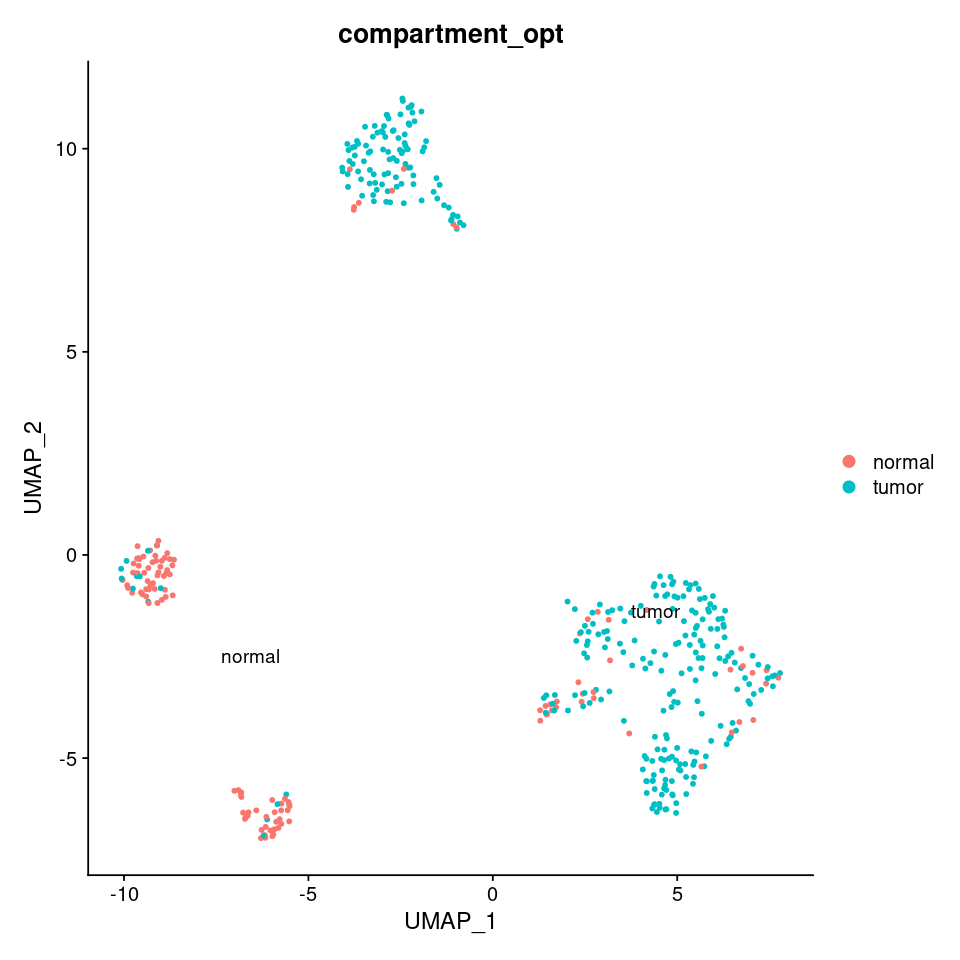

In [7]:
options(repr.plot.width=8, repr.plot.height=8)

DimPlot(object = object.list[[8]], reduction = 'umap',group.by="compartment_opt", label = TRUE, repel = TRUE)


In [ ]:

features <- SelectIntegrationFeatures(object.list = non_tumor.list)
object.list <- lapply(X = non_tumor.list, FUN = function(x) {
  x <- ScaleData(x, features = features, verbose = FALSE)
  x <- RunPCA(x, features = features, verbose = FALSE)
})

anchors <- FindIntegrationAnchors(object.list = object.list, dims = 1:50)

# Integrate data sets

seu <- IntegrateData(anchorset = anchors, dims = 1:50)
#DefaultAssay(seu) <- "integrated"

# Normal workflow
seu <- ScaleData(object = seu)
seu <- RunPCA(object = seu)
seu <- FindNeighbors(seu, dims = 1:30)
seu <- FindClusters(seu)
seu <- RunUMAP(object = seu, dims = 1:30)
saveRDS(seu,paste0("../data/sarcoma_all/data_numbat_sarcoma_all_merged_obj_non_malignant.rds"))


In [8]:
seu <- readRDS("../data/sarcoma_all/data_numbat_sarcoma_all_merged_obj_non_malignant.rds")

#SaveH5Seurat(tcell, filename = "DiffusionAnalysisData/all_non_malig.h5Seurat")
#Convert("DiffusionAnalysisData/all_non_malig.h5Seurat", dest = "h5ad")

In [9]:
seu@assays$RNA



#DefaultAssay(seu) <- 'RNA'
#seu <- NormalizeData(seu, verbose = FALSE)
#SaveH5Seurat(seu, filename = "DiffusionAnalysisData/all_non_malig_cells.h5Seurat")
#Convert("DiffusionAnalysisData/all_non_malig_cells.h5Seurat", dest = "h5ad")


Assay data with 35091 features for 29046 cells
First 10 features:
 MIR1302-2HG, AL627309.1, AL627309.2, AL627309.5, AP006222.2,
AL732372.1, AC114498.1, AL669831.2, LINC01409, FAM87B 

In [10]:
#write.csv(seu@meta.data, "DiffusionAnalysisData/all_non_malig_cells.h5Seurat")


In [11]:

bped <- celldex::BlueprintEncodeData()
Seurat_Object_Diet <- DietSeurat(seu)
pred <- SingleR(test = as.SingleCellExperiment(Seurat_Object_Diet), ref = bped, labels = bped$label.main,
                clusters = seu@meta.data$seurat_clusters)

snapshotDate(): 2021-10-19

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache



In [12]:
seu[["old.ident"]] <- Idents(object = seu)
nm = setNames(pred$labels, levels(Idents(seu)))
seu <- RenameIdents(seu, nm)
seu[["celltype_bped_fine"]] <- Idents(object = seu)        
Idents(object=seu) <- "old.ident"

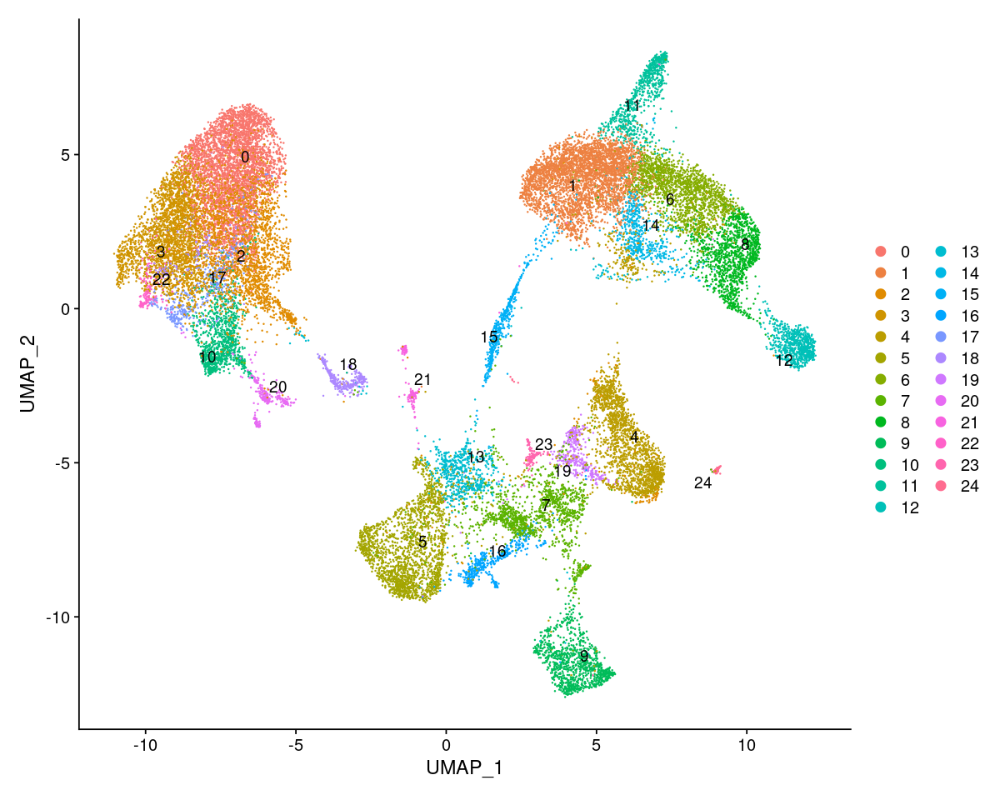

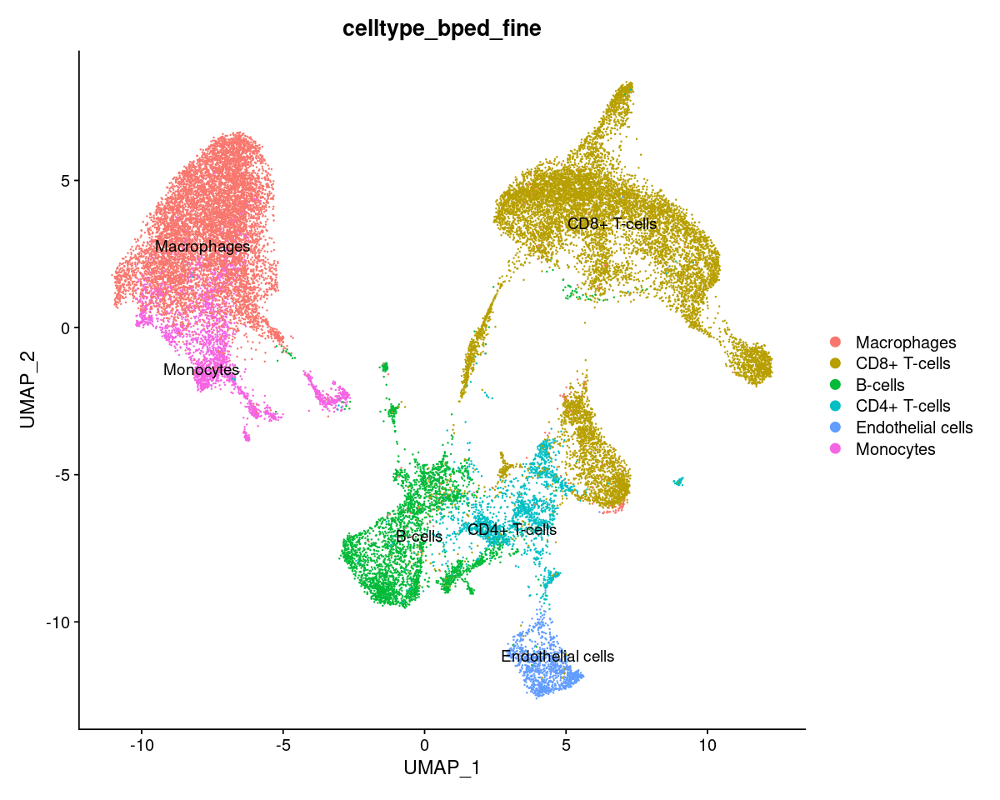

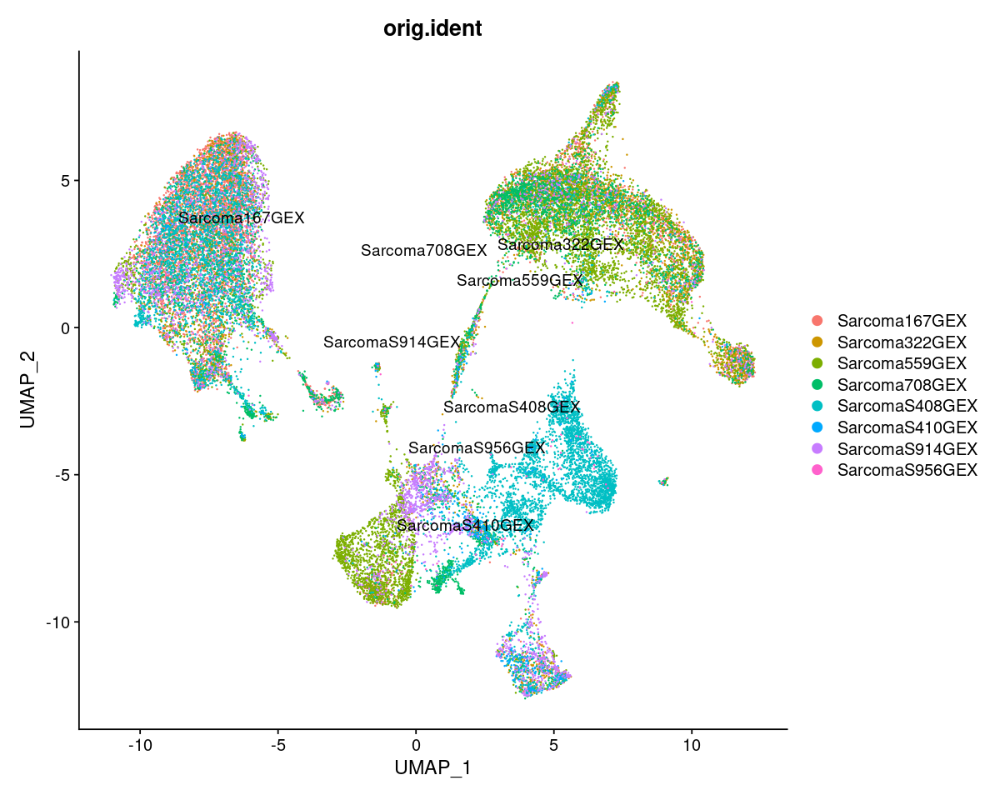

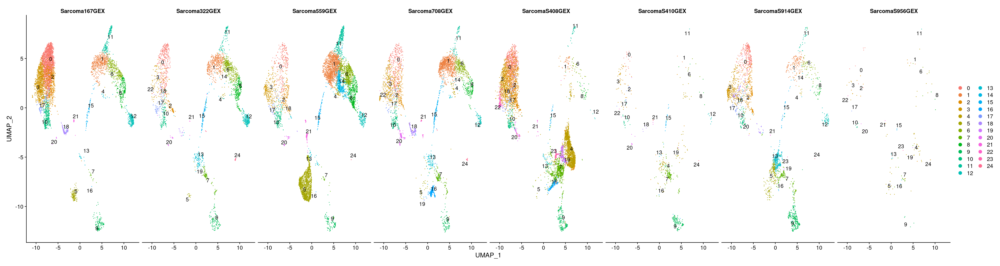

In [13]:
DefaultAssay(seu) <- "integrated"
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(object = seu, reduction = 'umap', label = TRUE, repel = TRUE)
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(object = seu, reduction = 'umap',group.by="celltype_bped_fine", label = TRUE, repel = TRUE)
DimPlot(object = seu, reduction = 'umap',group.by="orig.ident", label = TRUE, repel = TRUE)

options(repr.plot.width=30, repr.plot.height=8)
DimPlot(object = seu, reduction = 'umap', label = TRUE, repel = TRUE, split.by="patient")
# DefaultAssay(seu) <- "RNA"

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 29046
Number of edges: 1206370

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9482
Number of communities: 14
Elapsed time: 6 seconds


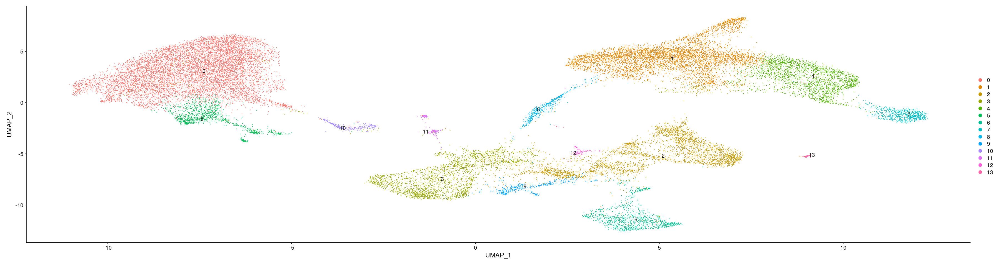

In [14]:
seu <- FindClusters(
  seu,
  resolution = 0.2)
DimPlot(object = seu, reduction = 'umap', label = TRUE, repel = TRUE)


In [15]:
seu@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,⋯,compartment_opt,p_6,p_7,p_x_6,p_x_7,p_y_6,p_y_7,integrated_snn_res.0.8,celltype_bped_fine,integrated_snn_res.0.2
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>
TGCCCTATCGGATGGA-1_1,Sarcoma167GEX,30615,6437,1.5841908,0.15351952,0.146986771,0.30050629,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
TACGGATTCAGCTTAG-1_1,Sarcoma167GEX,28514,6765,0.5155362,0.12625377,0.112225573,0.23847934,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
AGTGGGAGTCTTCTCG-1_1,Sarcoma167GEX,22749,6049,1.8066728,0.41760077,0.461558750,0.87915952,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
TACACGATCGTGGGAA-1_1,Sarcoma167GEX,21513,5672,1.2132199,0.20452750,0.144098917,0.34862641,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
CGATGGCGTGTGCCTG-1_1,Sarcoma167GEX,20163,5443,3.0055051,0.27277687,0.123989486,0.39676635,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
CGTTAGAGTGGTCTCG-1_1,Sarcoma167GEX,18676,5055,0.9959306,0.17134290,0.069608053,0.24095095,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
TACAGTGTCAAGCCTA-1_1,Sarcoma167GEX,17502,5167,3.2796252,0.23997257,0.131413553,0.37138613,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
ACACCCTTCACAAACC-1_1,Sarcoma167GEX,17431,5361,5.2722162,0.20079169,0.166370260,0.36716195,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6
GCTGGGTTCTGTTTGT-1_1,Sarcoma167GEX,17344,5421,1.0032288,0.14990775,0.098016605,0.24792435,Sarcoma167GEX,Endothelial cells,FALSE,⋯,normal,NA,NA,NA,NA,NA,NA,9,Endothelial cells,6


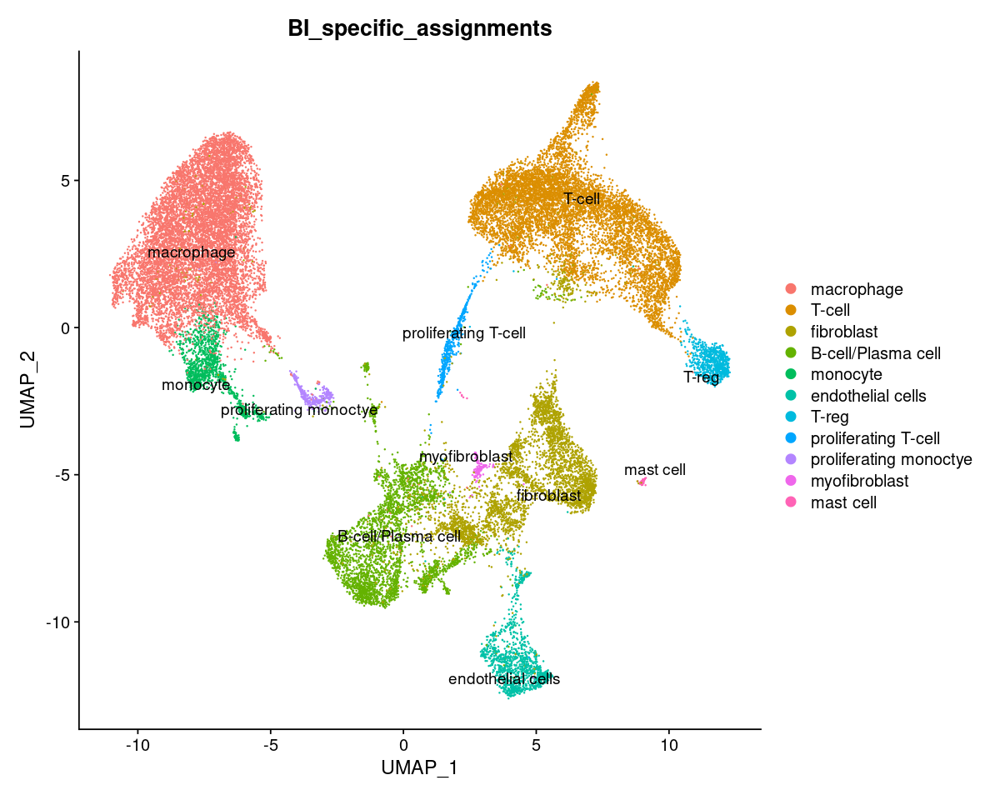

In [16]:
#Cell Type Groups
myeloids <- c(0, 5, 10, 13)
tcells <- c(1, 4, 7, 8)
bcells <- c(3, 9, 11)
stroma <- c(12, 6, 2)

broad_assignments <- c("Myeloid", "T-cell", "Stroma" ,"B-cell", "T-cell", "Myeloid" ,"Stroma" ,
           "T-cell", "T-cell",
           "B-cell", "Myeloid", "B-cell", "Stroma", "Myeloid")

broad_assignments_v2 <- c("Myeloid", "T-cell", "Fibroblast" ,"B-cell/Plasma cell", "T-cell", "Myeloid" ,"Endothelial cell" ,
           "T-cell", "T-cell",
           "B-cell/Plasma cell", "Myeloid", "B-cell/Plasma cell", "Myofibroblast", "Myeloid")

specific_assignments <- c("macrophage",
                          "T-cell",
"fibroblast",
"B-cell/Plasma cell",
"T-cell",
"monocyte",
"endothelial cells",
"T-reg",
"proliferating T-cell",
"B-cell/Plasma cell",
"proliferating monoctye",
"B-cell/Plasma cell",
"myofibroblast",
"mast cell")
Idents(object = seu) <- "integrated_snn_res.0.2"



nm <- setNames(broad_assignments, levels(Idents(seu)))
seu <- RenameIdents(seu, nm)
seu[["BI_broad_assignments"]] <- Idents(object = seu) 
Idents(object = seu) <- "integrated_snn_res.0.2"


nm <- setNames(broad_assignments_v2, levels(Idents(seu)))
seu <- RenameIdents(seu, nm)
seu[["BI_broad_assignments_v2"]] <- Idents(object = seu) 
Idents(object = seu) <- "integrated_snn_res.0.2"


nm <- setNames(specific_assignments, levels(Idents(seu)))
seu <- RenameIdents(seu, nm)
seu[["BI_specific_assignments"]] <- Idents(object = seu) 
options(repr.plot.width=10, repr.plot.height=8)

DimPlot(object = seu, 
reduction = 'umap',group.by="BI_specific_assignments", label = TRUE, repel = TRUE)


In [17]:
#SaveH5Seurat(seu, filename = "DiffusionAnalysisData/all_non_malig_cells.h5Seurat")
#Convert("DiffusionAnalysisData/all_non_malig_cells.h5Seurat", dest = "h5ad")
#write.csv(seu@meta.data, "DiffusionAnalysisData/all_non_malig_cells.h5Seurat")

In [18]:
seu@assays$RNA@data

  [[ suppressing 32 column names 'TGCCCTATCGGATGGA-1_1', 'TACGGATTCAGCTTAG-1_1', 'AGTGGGAGTCTTCTCG-1_1' ... ]]

  [[ suppressing 32 column names 'TGCCCTATCGGATGGA-1_1', 'TACGGATTCAGCTTAG-1_1', 'AGTGGGAGTCTTCTCG-1_1' ... ]]

  [[ suppressing 32 column names 'TGCCCTATCGGATGGA-1_1', 'TACGGATTCAGCTTAG-1_1', 'AGTGGGAGTCTTCTCG-1_1' ... ]]



35091 x 29046 sparse Matrix of class "dgCMatrix"
                                                                                  
MIR1302-2HG  .         .         .         .         .         .         .        
AL627309.1   .         .         .         .         .         .         .        
AL627309.2   .         .         .         .         .         .         .        
AL627309.5   .         .         0.3643512 .         .         .         .        
AP006222.2   .         .         .         .         .         .         .        
AL732372.1   .         .         .         .         .         .         .        
AC114498.1   .         .         .         .         .         .         .        
AL669831.2   .         .         .         .         .         .         .        
LINC01409    0.2826474 0.3006266 .         .         0.4027668 0.7279800 .        
FAM87B       .         0.3006266 .         .         .         .         .        
LINC01128    .         0.5314572 .    

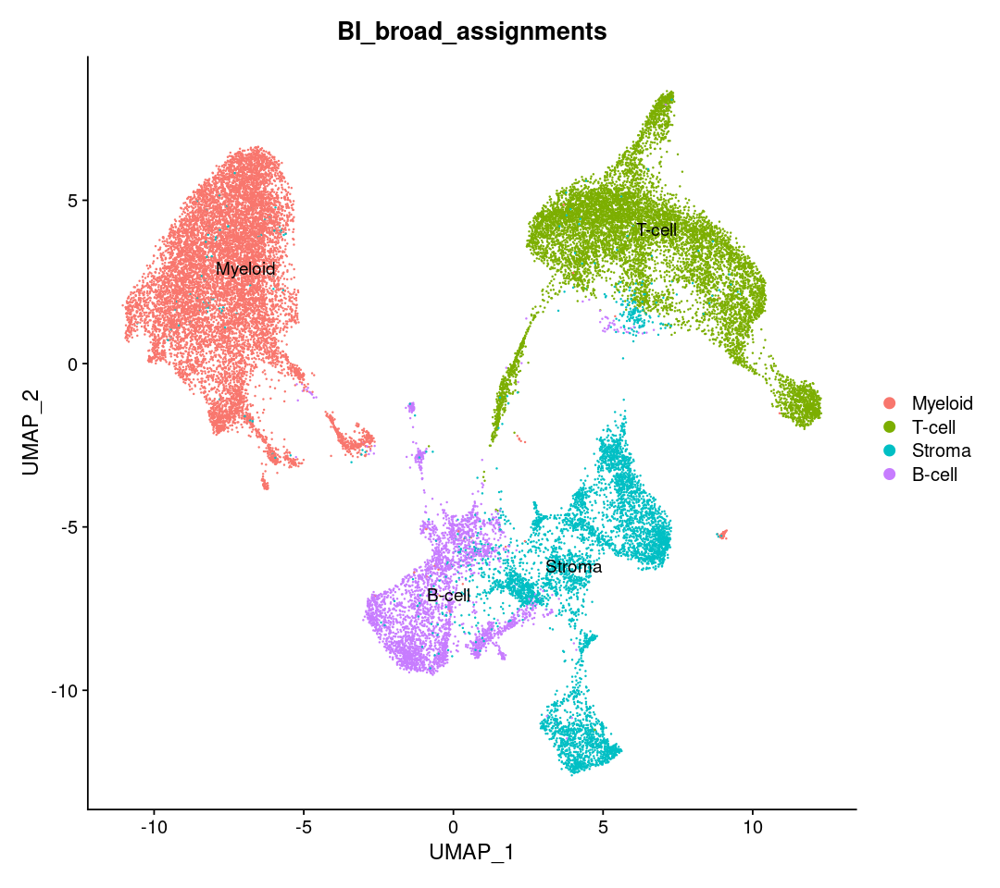

In [19]:
options(repr.plot.width=9, repr.plot.height=8)

DimPlot(object = seu, 
reduction = 'umap',group.by="BI_broad_assignments", label = TRUE, repel = TRUE)


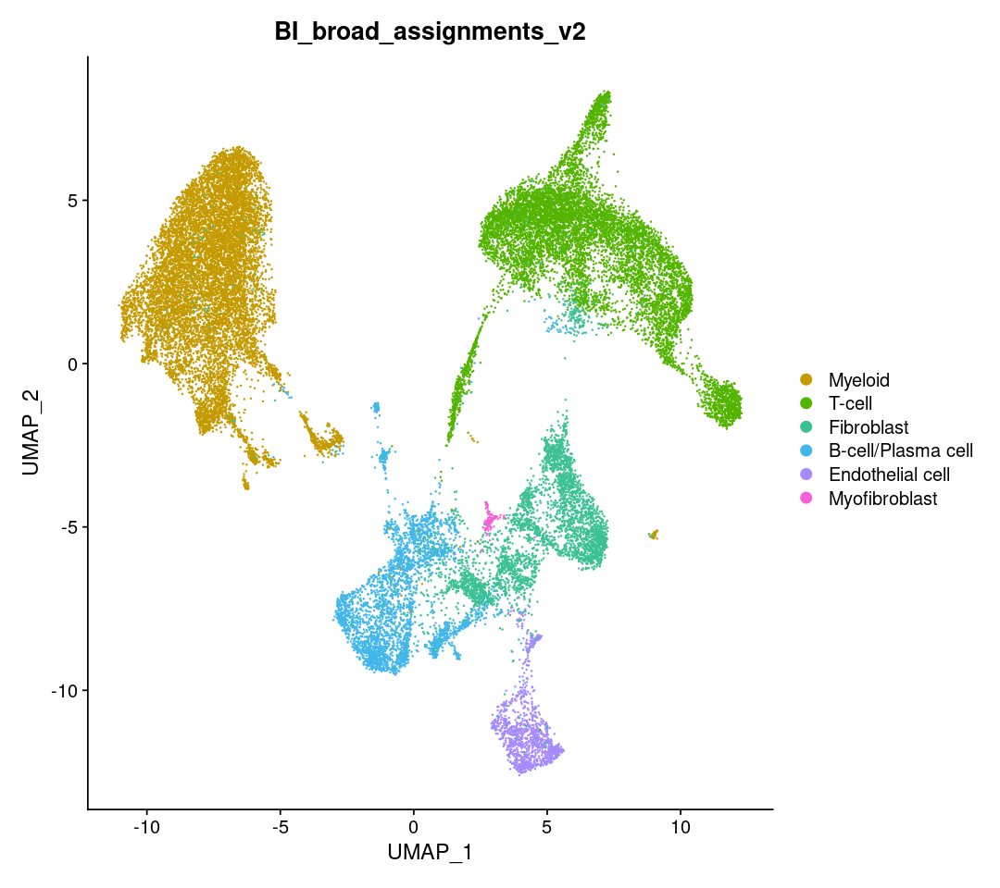

In [37]:
options(repr.plot.width=9, repr.plot.height=8)

custom_colors <- c("#c49a00", "#53b400", "#3bc193", "#40b6eb", '#a58aff', "#f761d7")


DimPlot(object = seu, 
reduction = 'umap',group.by="BI_broad_assignments_v2", label = FALSE, repel = TRUE,
       cols = custom_colors)


In [21]:
#write.csv(seu@meta.data, "DiffusionAnalysisData/all_non_tumor_BI_general_assignments_meta_data.csv")

In [22]:
tcell <- subset(seu, subset = BI_broad_assignments == "T-cell")
myeloid <- subset(seu, subset = BI_broad_assignments == "Myeloid")
tcell

An object of class Seurat 
37091 features across 9300 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

# Clustering T-Cells

In [23]:
tcell <- ScaleData(object = tcell)
tcell <- RunPCA(object = tcell)
tcell <- FindNeighbors(tcell, dims = 1:30)
tcell <- FindClusters(tcell)
tcell <- RunUMAP(object = tcell, dims = 1:30)



Centering and scaling data matrix

PC_ 1 
Positive:  ASPM, DIAPH3, RRM2, MKI67, ANLN, POLQ, KIF15, CIT, TOP2A, KNL1 
	   TPX2, NCAPG, GTSE1, KIF14, KIF23, TUBA1B, MELK, DLGAP5, KIF11, CENPF 
	   CDCA2, NEIL3, KIF4A, ECT2, KIF18B, KIFC1, NUSAP1, BUB1B, CENPE, HJURP 
Negative:  TC2N, ANK3, PLCB1, IL7R, NR3C2, TM4SF18, RASGRF2, MGAT4A, ITGBL1, TXNIP 
	   PARP8, SORL1, EPHA4, COL25A1, AC112770.1, CCDC80, PCAT1, GULP1, SERPINE1, CHI3L1 
	   AF165147.1, TPRG1, PITPNC1, AC090578.1, PKNOX2, STEAP4, STAT4, TXK, BACH2, CLSTN2 
PC_ 2 
Positive:  IL7R, BTBD11, LEF1, PLCL1, IL12RB2, AL136456.1, F5, LTB, RTKN2, RORA 
	   TSHZ2, PELI1, RASGRF2, BCAS1, BACH2, SORL1, TNFRSF4, IL2RA, FOS, SPOCK2 
	   ETV6, GPAT3, IL18R1, SSBP2, LINC02694, SLCO3A1, GPR183, NR3C2, FAM13A, MARCH3 
Negative:  AOAH, CCL5, KLRK1, SFMBT2, TOX, PPP2R2B, ATP8A1, MCTP2, DTHD1, MSC-AS1 
	   PDGFD, TTN, MCOLN2, PIK3AP1, ITGA1, ST6GALNAC3, ARAP2, THEMIS, CLNK, SLC24A3 
	   AL392086.3, CCL3, ABCB1, IKZF3, CRTAM, VCAM1, SNTB1, CRIM1, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 9300
Number of edges: 383608

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8374
Number of communities: 16
Elapsed time: 1 seconds


Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
03:43:20 UMAP embedding parameters a = 0.9922 b = 1.112

03:43:20 Read 9300 rows and found 30 numeric columns

03:43:20 Using Annoy for neighbor search, n_neighbors = 30

03:43:20 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

03:43:22 Writing NN index file to temp file /tmp/RtmpuPnhCp/file177e69592448

03:43:22 Searching Annoy index using 1 thread, search_k = 3000

03:43:25 Annoy recall = 100%

03:43:26 Commencing smooth kNN distance calibration using 1 thread

03:43:29 Initializing fro

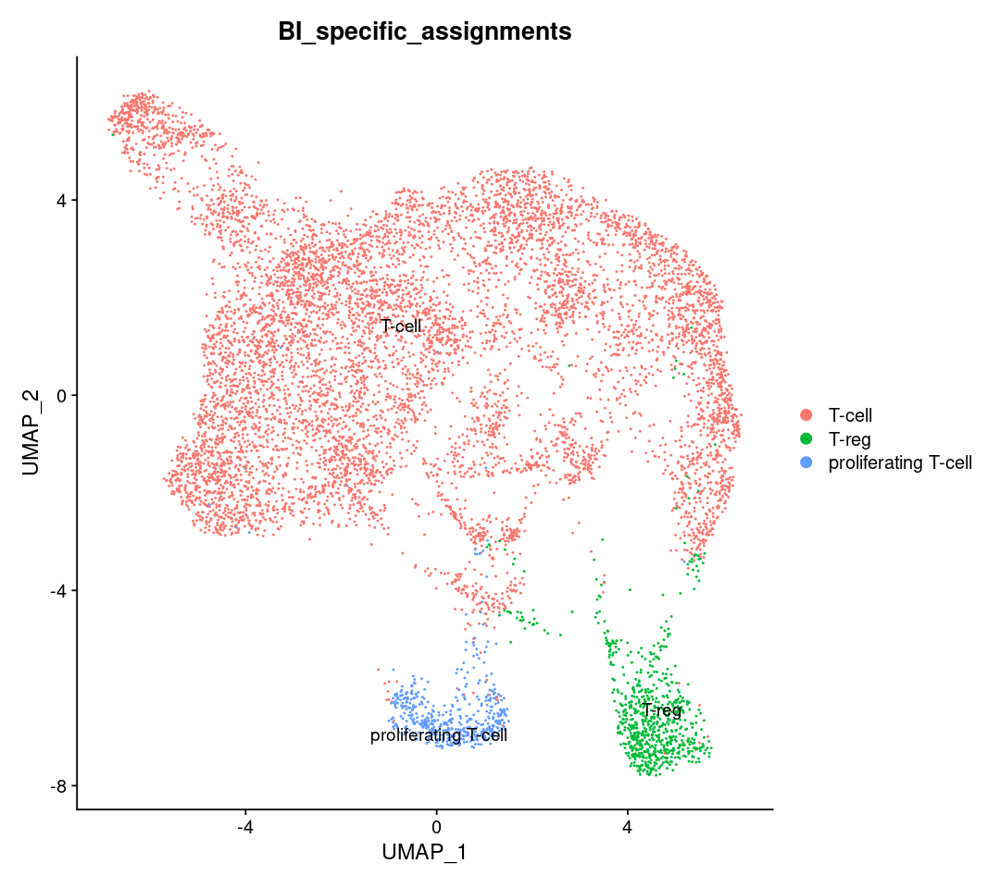

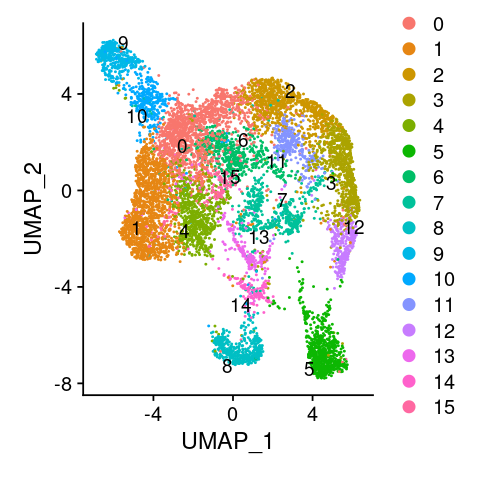

In [24]:
DimPlot(object = tcell, 
reduction = 'umap',group.by="BI_specific_assignments", label = TRUE, repel = TRUE)

options(repr.plot.width=4, repr.plot.height=4)

DimPlot(object = tcell, 
reduction = 'umap', label = TRUE, repel = TRUE)


In [25]:
#write.csv(tcell@assays$RNA@meta.features, "listofgenes.csv")

In [26]:
modules <- read.csv(file = 'TcellMarkerList.csv')

DefaultAssay(tcell) <- "RNA"

for (i in 1:length(modules)){
    genes <- (lapply(modules[i], function(x) x[x != ""]))[[1]]
    name <- colnames(modules)[i]   
    tcell<-AddModuleScore(tcell, list(genes), name = name)
    write.csv(tcell@meta.data,"tcellmodulescores.csv")     
}

                     
                     

Warning message:
"The following features are not present in the object: KLRB1 , not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: BRCA, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: ITGAE  , ITGA1 , CD69 , CD38 , SLAMF1 , TNFRSF9 , HLA-DRA , HLA-DRB1 , HLA-DRB3 , HLA-DRB4 , HLA-DRB5 , TIGIT , PRF1 , not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: IL2RA , ISG20 , FOXP3 , IL10 , not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: CCR7 , CD127, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: CD8A , CD8B , PDCD1 , TIGIT , EOMES , TBX21 , GZMK , HAVCR2 , TIM3 , not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: CD62L, not searching for symbol synonym

In [27]:
module_features <- c('DN.NKT1','Differentiation1','DN.T.cells1',
'Treg1','CD4..Tcm1','CD4..Tex1','CD8..Tex1','CD8..Trm1','CD8..Trm.Negative1','CD4..Tex.Tcm.Negative1')


for (i in 1:length(modules)){


    tcell@meta.data[module_features[i]]<-replace(pmax(tcell@meta.data[module_features[i]],0), 
                                                 is.na(pmax(tcell@meta.data[module_features[i]],0)), 0)
}


In [ ]:
FeaturePlot(object = subset(tcell, idents = c(9, 10)) , features ="NCAM1")


In [ ]:
DimPlot(object = subset(tcell, idents = c(0, 1,4, 15)))


In [ ]:
FeaturePlot(object = subset(tcell, idents = c(0, 1,4, 15)) , features ='CD8..Tex1' )


In [ ]:
FeaturePlot(object = tcell , features ='IL7R' )
#EOMES

In [ ]:
t.cell.markers<- FindAllMarkers(tcell) 
write.csv(t.cell.markers, "tcell_markers.csv")

In [89]:
levels(Idents(tcell))



[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15"

In [32]:
#temporary t-cell assignments

assignments_k <- c("low-quality CD8+ T",
"CD8+ Tex",
"low-quality GZMK+/EOMES+/CD8+ Tex",
"CD4+ Tcm",
"CD8+ Trm",
"Treg",
"low-quality CD8+ T",
"low-quality CD8+ T",
"Differentiating aDNT",
"DN NKT",
"low-quality DN NKT",
"CD8+ Trm",
"CD4+ Tex",
"low-quality DP T",
"CD4+ Tex",
"CD8+ Tex")

assignments_b <- c("Trm CD8+ T",
"TD CD8+",
"Naive T",
'Progenitor-like CD4+ T',
"Trm CD8+ T",
'Treg',
'Low Quality',
'Progenitor-like CD8+ T',
'Proliferating T',
'GNLY high NK',
'GNLY mid NK',
'Naive T',
'Effector CD4+ T',
'Activated Macrophage',
'Fibroblast',
'Low Quality')




tcell@meta.data[["subclusters"]] <- Idents(tcell)
nm <- setNames(assignments_b, levels(Idents(tcell)))
tcell <- RenameIdents(tcell, nm)
tcell@meta.data[["bi_assignments"]] <- Idents(object = tcell) 
Idents(object = tcell) <- "subclusters"

In [33]:
tcell@meta.data[["subclusters"]] <- Idents(tcell)
nm <- setNames(assignments_k, levels(Idents(tcell)))
tcell <- RenameIdents(tcell, nm)
tcell@meta.data[["k_assignments"]] <- Idents(object = tcell) 
Idents(object = tcell) <- "subclusters"


In [34]:
colnames(tcell@meta.data)

[1] "orig.ident"               "nCount_RNA"              
 [3] "nFeature_RNA"             "percent.mt"              
 [5] "percent.rps"              "percent.rpl"             
 [7] "percent.rp"               "patient"                 
 [9] "celltype_initial_singleR" "predicted_doublets"      
[11] "doublet_scores"           "RNA_snn_res.0.8"         
[13] "seurat_clusters"          "old.ident"               
[15] "celltype_"                "celltype_singleR"        
[17] "barcode_orig"             "cell"                    
[19] "clone_opt"                "GT_opt"                  
[21] "p_opt"                    "p_1"                     
[23] "p_2"                      "p_3"                     
[25] "p_4"                      "p_5"                     
[27] "p_x_1"                    "p_x_2"                   
[29] "p_x_3"                    "p_x_4"                   
[31] "p_x_5"                    "p_y_1"                   
[33] "p_y_2"                    "p_y_3"                   
[35] "p_y_4"                    "p_y_5"                   
[37] "p_cnv"                    "p_cnv_x"                 
[39] "p_cnv_y"                  "compartment_opt"         
[41] "p_6"                      "p_7"                     
[43] "p_x_6"                    "p_x_7"                   
[45] "p_y_6"                    "p_y_7"                   
[47] "integrated_snn_res.0.8"   "celltype_bped_fine"      
[49] "integrated_snn_res.0.2"   "BI_broad_assignments"    
[51] "BI_broad_assignments_v2"  "BI_specific_assignments" 
[53] "DN.NKT1"                  "Differentiation1"        
[55] "DN.T.cells1"              "Treg1"                   
[57] "CD4..Tcm1"                "CD4..Tex1"               
[59] "CD8..Tex1"                "CD8..Trm1"               
[61] "CD8..Trm.Negative1"       "CD4..Tex.Tcm.Negative1"  
[63] "subclusters"              "bi_assignments"          
[65] "k_assignments"

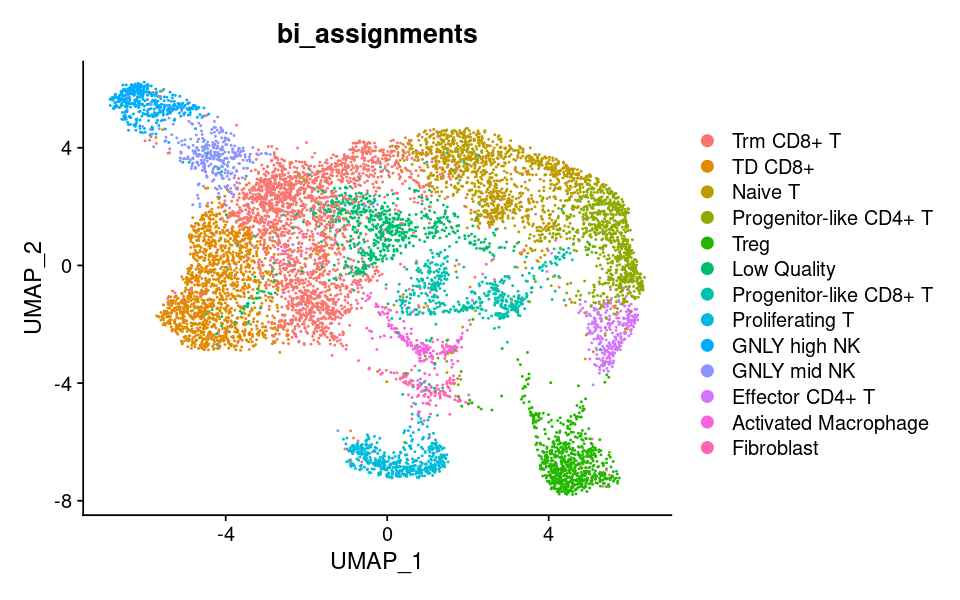

In [35]:
options(repr.plot.width = 8, repr.plot.height=5)

DimPlot(object = tcell, group.by = "bi_assignments",label = FALSE, repel = TRUE)


In [28]:
#SaveH5Seurat(tcell, filename = "DiffusionAnalysisData/all_tcells.h5Seurat")
#Convert("DiffusionAnalysisData/all_tcells.h5Seurat", dest = "h5ad")
#write.csv(tcell@meta.data, "DiffusionAnalysisData/all_tcells.h5Seurat")

DefaultAssay(cd8_t) <- "integrated"

t_cells_seu <- as.SingleCellExperiment(tcell)
dm_cd8_only_raw <- DiffusionMap(t_cells_seu, verbose = TRUE, n_pcs = 25)
saveRDS(dm_cd8_only_raw, "DiffusionAnalysisData/Integrated_BI_all_tcell_DM_obj_25.rds")
write.csv(dm_cd8_only_raw@eigenvectors, "DiffusionAnalysisData/Integrated_BI_all_tcell_DM_obj_25_eigenvectors.csv")


ERROR: Error in DefaultAssay(cd8_t) <- "integrated": object 'cd8_t' not found


In [ ]:
options(repr.plot.width=20, repr.plot.height=10)

FeaturePlot(object = tcell, features = c("doublet_scores", 'nFeature_RNA'),label = TRUE, repel = TRUE)


In [ ]:
t_cells_seu

In [133]:
cd8_t <- subset(tcell, idents = c(0, 1, 4,7))
DefaultAssay(cd8_t) <- "RNA"
DefaultAssay(cd8_t) <- "integrated"

t_cells_seu <- as.SingleCellExperiment(cd8_t)
dm_cd8_only_raw <- DiffusionMap(t_cells_seu, verbose = TRUE, n_pcs = 25)
saveRDS(dm_cd8_only_raw, "DiffusionAnalysisData/Integrated_non_rna_BI_CD8T_cell_DM_obj_25.rds")
write.csv(dm_cd8_only_raw@eigenvectors, "DiffusionAnalysisData/Integrated_non_rna_BI_CD8T_cell_DM_obj_25_eigenvectors.csv")


finding knns......done. Time: 20.20s
Calculating transition probabilities......done. Time: 0.95s

performing eigen decomposition......done. Time: 2.57s


In [30]:
cd8_t <- subset(tcell, idents = c(0, 1, 4,7))
DefaultAssay(cd8_t) <- "RNA"

SaveH5Seurat(cd8_t, filename = "DiffusionAnalysisData/bi_cd8_tcells_rna.h5Seurat")
Convert("DiffusionAnalysisData/bi_cd8_tcells_rna.h5Seurat", dest = "h5ad")
write.csv(cd8_t@meta.data, "DiffusionAnalysisData/bi_cd8_tcells_rna.h5Seurat")

Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding data for integrated

Adding scale.data for integrated

Adding variable features for integrated

No feature-level metadata found for integrated

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap

No loadings for umap

No projected loadings for umap

No standard deviations for umap

No JackStraw data for umap

Validating h5Seurat file

Adding data from RNA as X

Adding counts from RNA as raw

Transfering meta.data to obs

Adding dimensional reduction information for umap (global)



In [ ]:
t_cells_seu <- as.SingleCellExperiment(tcell)

dm_cd8_only_raw <- DiffusionMap(t_cells_seu, verbose = TRUE, n_pcs = 50)
saveRDS(dm_cd8_only_raw, "DiffusionAnalysisData/Integrated_T_cell_DM_obj_50.rds")

write.csv(dm_cd8_only_raw@eigenvectors, "DiffusionAnalysisData/Integrated_T_cell_DM_obj_50_eigenvectors.rds")
eigenvectors_filter <- dm_cd8_only_raw@eigenvectors

library(dplyr)


eigenvectors_filter <- data.frame(eigenvectors_filter) %>% dplyr::filter(DC3<0.01)
eigenvectors_filter <-data.frame(eigenvectors_filter) %>% dplyr::filter(DC2<0.1)
eigenvectors_filter <-data.frame(eigenvectors_filter) %>% dplyr::filter(DC1<0.1)
eigenvectors_filter <-data.frame(eigenvectors_filter) %>% dplyr::filter(DC1>-0.01)
eigenvectors_filter
tcell_filt = subset(tcell, names %in% rownames(eigenvectors_filter))
t_cells_seu <- as.SingleCellExperiment(tcell_filt)

dm_cd8_only_raw <- DiffusionMap(t_cells_seu, verbose = TRUE, n_pcs = 50)

saveRDS(dm_cd8_only_raw, "DiffusionAnalysisData/Integrated_T_cell_DM_obj_50_custom_filt.rds")
write.csv(dm_cd8_only_raw@eigenvectors, "DiffusionAnalysisData/Integrated_T_cell_DM_obj_50_custom_filt.csv")

In [469]:
tcell@meta.data["names"] = rownames(tcell@meta.data)

In [475]:
SaveH5Seurat(tcell_filt, filename = "DiffusionAnalysisData/tcell_filt.h5Seurat")
Convert("DiffusionAnalysisData/tcell_filt.h5Seurat", dest = "h5ad")
write.csv(tcell_filt@meta.data, "DiffusionAnalysisData/tcell_filt.csv")

Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding data for integrated

Adding scale.data for integrated

Adding variable features for integrated

No feature-level metadata found for integrated

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap

No loadings for umap

No projected loadings for umap

No standard deviations for umap

No JackStraw data for umap

Validating h5Seurat file

Adding data from RNA as X

Adding counts from RNA as raw

Transfering meta.data to obs

Adding dimensional reduction information for umap (global)



In [460]:
eigenvectors_filter

,DC1,DC2,DC3,DC4,DC5,DC6,DC7,DC8,DC9,DC10,DC11,DC12,DC13,DC14,DC15,DC16,DC17,DC18,DC19,DC20
TGCTACCTCTAACCGA-1_1,-1.270044e-03,0.0019744501,0.0014116237,0.0013453052,0.005190118,7.059001e-03,5.533390e-03,0.0169090248,0.0045948182,7.724873e-03,0.0172303852,-0.0037706479,-0.0004450741,0.0032655769,0.0115246249,0.0038221492,6.768562e-05,0.0009949676,-1.156894e-03,0.0006702336
ATGTGTGCAATGCCAT-1_1,-7.345713e-04,-0.0029152724,0.0027566400,-0.0032672946,0.004618228,-8.888829e-04,2.258936e-02,0.0109048892,0.0032169950,-4.311051e-04,-0.0018780766,-0.0050181051,0.0047797545,0.0034044590,0.0022399418,0.0052512752,-3.655476e-03,0.0022841250,-2.596340e-03,-0.0026545541
TCGTAGAAGACGCACA-1_1,3.967560e-03,-0.0054553178,-0.0024775889,-0.0087313908,0.008100391,9.822633e-04,5.060551e-02,0.0170471683,0.0010476744,-3.337014e-05,-0.0063928750,-0.0074771855,0.0058398933,0.0034847972,0.0012830505,0.0028793595,-1.346427e-02,0.0076637425,3.441844e-03,-0.0153815778
ACTGAGTCAGACGCCT-1_1,-1.388874e-03,0.0039944480,0.0003813356,0.0032707893,0.026880156,3.104082e-02,-4.294681e-03,-0.0057183490,-0.0002243991,-6.287466e-03,-0.0009276329,-0.0003668543,0.0126515267,0.0084595304,-0.0196966561,0.0004504683,8.422305e-03,0.0022465206,4.983291e-03,-0.0002551655
GCTGCGAGTAACGCGA-1_1,3.284790e-03,-0.0041083675,-0.0034846637,-0.0107075356,0.007050728,1.578070e-03,4.774855e-02,0.0147704309,0.0046639052,5.773179e-04,-0.0070661728,-0.0081455657,0.0046557944,0.0036247008,0.0031306203,0.0019016042,-9.723993e-03,0.0076158086,2.898982e-03,-0.0123731604
TACGGATTCACTTCAT-1_1,3.643405e-03,-0.0050942997,-0.0005477104,-0.0038530358,0.005863465,-1.450177e-04,4.031169e-02,0.0148950501,-0.0029178603,-2.669477e-03,-0.0022103706,-0.0048643308,0.0070436153,0.0023758115,-0.0009431839,0.0045415123,-1.491187e-02,0.0069335659,2.639448e-03,-0.0135332882
TAGGCATCAAGCTGAG-1_1,4.489126e-03,-0.0062324440,-0.0024038740,-0.0084782484,0.007834584,1.029992e-03,4.992996e-02,0.0177941416,-0.0021370263,-1.789563e-03,-0.0052060894,-0.0064904106,0.0054921826,0.0031333309,0.0008732944,0.0028179441,-1.349324e-02,0.0072913324,3.487861e-03,-0.0162054864
CTGTGCTTCACCTCGT-1_1,1.160909e-04,0.0021237237,0.0026551167,0.0085308122,-0.003365427,-4.521100e-03,8.213234e-03,-0.0008383892,-0.0007616814,1.785424e-03,0.0070033649,-0.0012163415,0.0150713149,-0.0004578042,-0.0052325565,0.0092776424,-1.711959e-02,0.0073045273,-1.608967e-03,0.0041560149
CCAATCCGTGCCTGGT-1_1,-2.809009e-03,0.0053777176,-0.0033182165,-0.0060544685,0.012737399,-1.478540e-02,-1.090940e-02,0.0088600792,-0.0084671986,3.932667e-03,-0.0031174731,-0.0296164591,-0.0039309547,-0.0136646743,-0.0065912674,-0.0078562177,-2.334108e-03,0.0035111822,-3.087949e-02,-0.0050424396
CTAAGACCATTAACCG-1_1,-6.951794e-04,0.0032464497,0.0015577457,0.0061762393,0.012505747,1.513180e-02,-2.414395e-03,0.0021884617,0.0013223526,-6.231040e-03,-0.0012466175,-0.0005945180,0.0085982373,-0.0010475229,0.0003307422,0.0052917348,-4.520888e-04,0.0037851242,8.778096e-04,0.0029223120


In [445]:
#SaveH5Seurat(tcell, filename = "DiffusionAnalysisData/tcells.h5Seurat")
#Convert("DiffusionAnalysisData/tcells.h5Seurat", dest = "h5ad")
write.csv(tcell@meta.data, "DiffusionAnalysisData/tcells.csv")

# Clustering Myeloids

In [13]:
myeloid <- subset(seu, subset = BI_broad_assignments == "Myeloid")

myeloid <- ScaleData(object = myeloid)
myeloid <- RunPCA(object = myeloid)
myeloid <- FindNeighbors(myeloid, dims = 1:30)
myeloid <- FindClusters(
  myeloid,
  resolution = 0.5)
myeloid <- RunUMAP(object = myeloid, dims = 1:30)
myeloid@meta.data

Centering and scaling data matrix

PC_ 1 
Positive:  AL162414.1, CD163, F13A1, KCNMA1, DOCK4, FRMD4B, UNC5C, ME1, SLCO2B1, ITSN1 
	   DMXL2, FMN1, LRMDA, SLC9A9, SELENOP, CR1, PLXDC2, CD163L1, FRMD4A, MS4A6A 
	   MERTK, FMNL2, LGMN, RGL1, STAB1, SLC1A3, RASSF4, TFEC, MS4A7, CXCL12 
Negative:  SKAP1, MZB1, TENT5C, IKZF3, GRAP2, TOX, LINC01934, SLC38A1, RASSF6, SLC24A3 
	   CLNK, NELL2, BCL11B, DERL3, CD96, TC2N, PPP1R16B, KIT, IRF4, ADAM12 
	   ITK, COL22A1, IL18R1, ACOXL, EMCN, DTHD1, LINC02694, RPS8, EPB41L4A, AC104248.1 
PC_ 2 
Positive:  GLYATL2, LINC01204, DNAJC6, TC2N, GRAP2, DTHD1, F3, LDB2, EPHA4, PRKCQ 
	   EMCN, COL22A1, SPOCK2, KIT, BCL11B, NELL2, GATA2, CCDC141, SLC24A3, LINC01934 
	   LOXL2, NTN4, SKAP1, IKZF3, LINC01695, COL18A1, CRISPLD1, CADPS, LINC01920, JAG1 
Negative:  ASPM, KIF11, BUB1B, DIAPH3, MKI67, KNL1, IQGAP3, GTSE1, DEPDC1B, CDCA2 
	   AURKB, KIF15, KIF4A, KIF18B, NUSAP1, POLQ, CKAP2L, NUF2, CDH18, RRM2 
	   HMMR, SPC25, ANLN, NDC80, NEIL3, RGS7BP, TOP2A, CIT,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11185
Number of edges: 425798

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8366
Number of communities: 14
Elapsed time: 1 seconds


Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
03:01:16 UMAP embedding parameters a = 0.9922 b = 1.112

03:01:16 Read 11185 rows and found 30 numeric columns

03:01:16 Using Annoy for neighbor search, n_neighbors = 30

03:01:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

03:01:19 Writing NN index file to temp file /tmp/Rtmpy6vhwQ/file6e9701ad983

03:01:19 Searching Annoy index using 1 thread, search_k = 3000

03:01:23 Annoy recall = 100%

03:01:24 Commencing smooth kNN distance calibration using 1 thread

03:01:26 Initializing fro

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,⋯,p_x_7,p_y_6,p_y_7,integrated_snn_res.0.8,celltype_bped_fine,integrated_snn_res.0.2,BI_broad_assignments,BI_broad_assignments_v2,BI_specific_assignments,integrated_snn_res.0.5
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AGGGTGACATTAGCCA-1_1,Sarcoma167GEX,9593,4041,5.6082560,0.19806109,0.09381841,0.29187950,Sarcoma167GEX,CD8+ T-cells,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CTACCCACAAACTGTC-1_1,Sarcoma167GEX,8636,3402,1.4705882,0.16211209,0.03473830,0.19685039,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,10
TGGCCAGTCATGCTCC-1_1,Sarcoma167GEX,8538,3316,1.1126728,0.15226048,0.00000000,0.15226048,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,6
CCTAAAGGTTCACCTC-1_1,Sarcoma167GEX,7539,3089,6.1944555,0.13264359,0.01326436,0.14590795,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CGGAGTCTCCAAACTG-1_1,Sarcoma167GEX,7366,3227,2.4029324,0.13575889,0.08145534,0.21721423,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,0,Myeloid,Myeloid,macrophage,5
AGCGTATAGGCCGAAT-1_1,Sarcoma167GEX,6524,2830,1.5941140,0.16860822,0.06131208,0.22992029,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,3
CAAGGCCAGGGAAACA-1_1,Sarcoma167GEX,6606,2902,2.3160763,0.19679080,0.03027551,0.22706630,Sarcoma167GEX,Monocytes,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
TGCGGGTAGATCTGCT-1_1,Sarcoma167GEX,6279,2935,1.1626055,0.28666985,0.03185221,0.31852206,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
ACCGTAACAAACAACA-1_1,Sarcoma167GEX,6300,2898,3.4603175,0.42857143,0.73015873,1.15873016,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,4


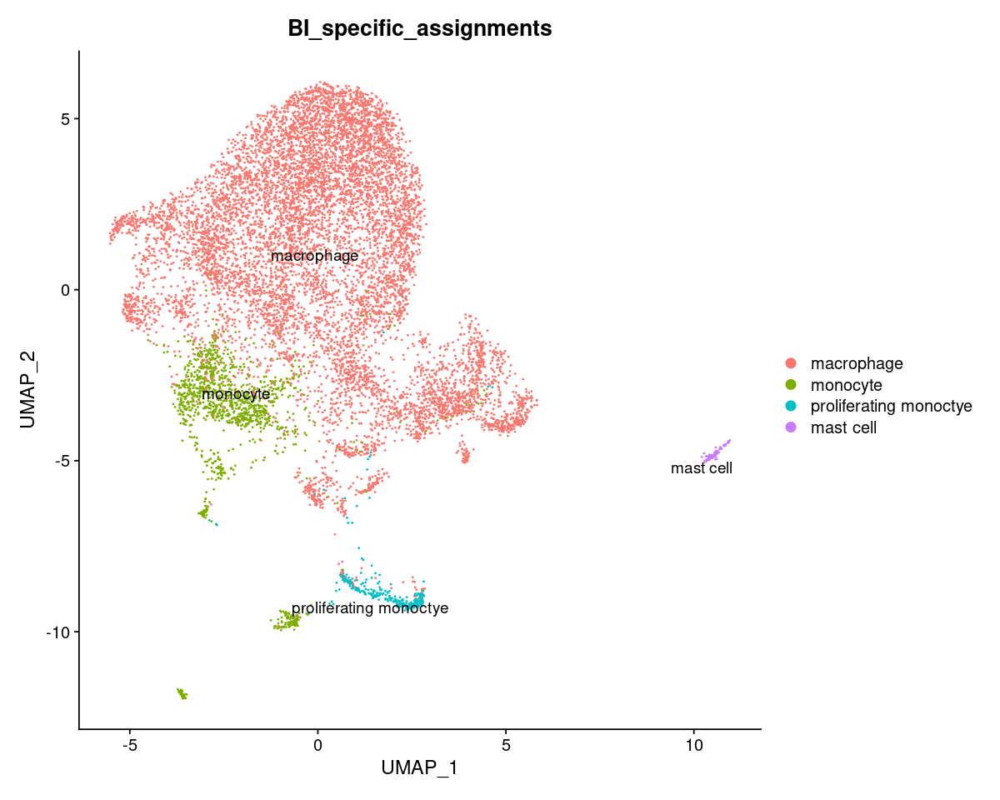

In [14]:
DimPlot(object = myeloid, 
reduction = 'umap',group.by="BI_specific_assignments", label = TRUE, repel = TRUE)


In [15]:
DefaultAssay(myeloid) <- "RNA"

AddModuleScore(myeloid,(m1))@meta.data

ERROR: Error in AddModuleScore(myeloid, (m1)): object 'm1' not found


In [ ]:

m1=c('CD80','CD86','FCGR1A','FCGR3A','FCGR3B') # HLA-DR and MHCII high; verified: https://www.cusabio.com/
m2=c('MRC1','CD163','CD68') # CD163 is exclusive, HLA-DR and MHCII high; verified: https://www.cusabio.com/
m2a=c('CD163','MRC1','CD200R1') # verified: https://www.rndsystems.com/
m2c=c('SCARB1','TLR8','CCL18') # SCARB1 is exclusive; verified: https://www.rndsystems.com/
m2d = c('VEGFA','ITGB3','NRP1','FLT1','SEMA3C','CXCL8','CCL2','ADM','CSF1','MARCO') # some of them were exclusively expressed
HLA_DR=c('HLA-DRA','HLA-DRB1','HLA-DRB3','HLA-DRB4','HLA-DRB5')
mhcII=c('HLA-DPA1','HLA-DMB','HLA-DOA','HLA-DOB','HLA-DQA1','HLA-DQB1','HLA-DRA','HLA-DRB1','HLA-DRB3','HLA-DRB4','HLA-DRB5')
mhcI=c('HLA-A','HLA-B','HLA-C')
eosinophils = c("CSF2", "SIGLEC8", "EPX", "EAR2", "EAR1", "LTC4", "CCL1", "IKZF2", "CPA3", "CCL5", "PRG2", "IL5")
dendritic_cells = c("ZBTB46", "ITGAX", "LAMP3", "CX3CR1", "ITGAM", "IL6", "CD86", "CD83")
monocytes = c("CD14","CD16", "CCR2","CX3CR1", "CD11B" )
mast_cells = c("SLC29A1", "TPSAB1", "KIT", "LTC4S", "IL1RL1", "HDC")
macrophages = c("CD68", "CD163","JAML", "LYZ")
modules_to_add <- list(m1, m2, m2a, m2c, m2d, HLA_DR, mhcII, mhcI,eosinophils,dendritic_cells,monocytes,mast_cells,macrophages)
names <- c('m1.', 'm2.', 'm2a.', 'm2c.', 'm2d.', 'HLA_DR.', 'mhcII.', 'mhcI.',
           'eosinophils.','dendritic_cells.','monocytes.','mast_cells.','macrophages.')


myeloid<-AddModuleScore(myeloid,modules_to_add, name=names)


myeloid_names <- c('m1.1','m2.2','m2a.3','m2c.4','m2d.5','HLA_DR.6','mhcII.7','mhcI.8',
                  'eosinophils.9','dendritic_cells.10','monocytes.11','mast_cells.12','macrophages.13')

for (i in 1:length(myeloid_names)){


    myeloid@meta.data[myeloid_names[i]]<-replace(pmax(myeloid@meta.data[myeloid_names[i]],0), 
                                                 is.na(pmax(myeloid@meta.data[myeloid_names[i]],0)), 0)
}




In [16]:
myeloid@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,⋯,p_x_7,p_y_6,p_y_7,integrated_snn_res.0.8,celltype_bped_fine,integrated_snn_res.0.2,BI_broad_assignments,BI_broad_assignments_v2,BI_specific_assignments,integrated_snn_res.0.5
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AGGGTGACATTAGCCA-1_1,Sarcoma167GEX,9593,4041,5.6082560,0.19806109,0.09381841,0.29187950,Sarcoma167GEX,CD8+ T-cells,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CTACCCACAAACTGTC-1_1,Sarcoma167GEX,8636,3402,1.4705882,0.16211209,0.03473830,0.19685039,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,10
TGGCCAGTCATGCTCC-1_1,Sarcoma167GEX,8538,3316,1.1126728,0.15226048,0.00000000,0.15226048,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,6
CCTAAAGGTTCACCTC-1_1,Sarcoma167GEX,7539,3089,6.1944555,0.13264359,0.01326436,0.14590795,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CGGAGTCTCCAAACTG-1_1,Sarcoma167GEX,7366,3227,2.4029324,0.13575889,0.08145534,0.21721423,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,0,Myeloid,Myeloid,macrophage,5
AGCGTATAGGCCGAAT-1_1,Sarcoma167GEX,6524,2830,1.5941140,0.16860822,0.06131208,0.22992029,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,3
CAAGGCCAGGGAAACA-1_1,Sarcoma167GEX,6606,2902,2.3160763,0.19679080,0.03027551,0.22706630,Sarcoma167GEX,Monocytes,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
TGCGGGTAGATCTGCT-1_1,Sarcoma167GEX,6279,2935,1.1626055,0.28666985,0.03185221,0.31852206,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
ACCGTAACAAACAACA-1_1,Sarcoma167GEX,6300,2898,3.4603175,0.42857143,0.73015873,1.15873016,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,4


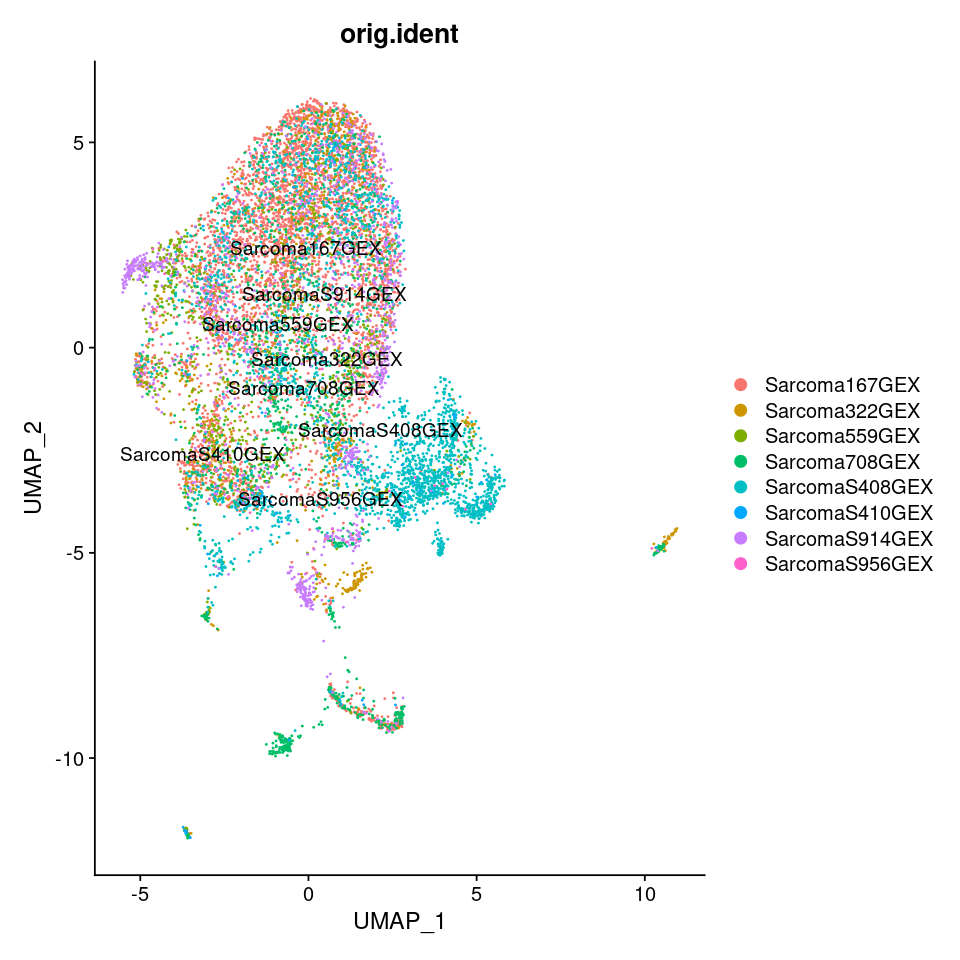

In [17]:
options(repr.plot.width=8, repr.plot.height=8)

DimPlot(object = myeloid, reduction = 'umap', group.by='orig.ident', label = TRUE, repel = TRUE)


In [18]:
myeloid@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,⋯,p_x_7,p_y_6,p_y_7,integrated_snn_res.0.8,celltype_bped_fine,integrated_snn_res.0.2,BI_broad_assignments,BI_broad_assignments_v2,BI_specific_assignments,integrated_snn_res.0.5
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AGGGTGACATTAGCCA-1_1,Sarcoma167GEX,9593,4041,5.6082560,0.19806109,0.09381841,0.29187950,Sarcoma167GEX,CD8+ T-cells,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CTACCCACAAACTGTC-1_1,Sarcoma167GEX,8636,3402,1.4705882,0.16211209,0.03473830,0.19685039,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,10
TGGCCAGTCATGCTCC-1_1,Sarcoma167GEX,8538,3316,1.1126728,0.15226048,0.00000000,0.15226048,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,6
CCTAAAGGTTCACCTC-1_1,Sarcoma167GEX,7539,3089,6.1944555,0.13264359,0.01326436,0.14590795,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
CGGAGTCTCCAAACTG-1_1,Sarcoma167GEX,7366,3227,2.4029324,0.13575889,0.08145534,0.21721423,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,0,Myeloid,Myeloid,macrophage,5
AGCGTATAGGCCGAAT-1_1,Sarcoma167GEX,6524,2830,1.5941140,0.16860822,0.06131208,0.22992029,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,3,Macrophages,0,Myeloid,Myeloid,macrophage,3
CAAGGCCAGGGAAACA-1_1,Sarcoma167GEX,6606,2902,2.3160763,0.19679080,0.03027551,0.22706630,Sarcoma167GEX,Monocytes,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
TGCGGGTAGATCTGCT-1_1,Sarcoma167GEX,6279,2935,1.1626055,0.28666985,0.03185221,0.31852206,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,18,Monocytes,10,Myeloid,Myeloid,proliferating monoctye,9
ACCGTAACAAACAACA-1_1,Sarcoma167GEX,6300,2898,3.4603175,0.42857143,0.73015873,1.15873016,Sarcoma167GEX,Macrophages,FALSE,⋯,NA,NA,NA,0,Macrophages,0,Myeloid,Myeloid,macrophage,4


In [19]:
options(repr.plot.width=13, repr.plot.height=12)

FeaturePlot(object = myeloid, features = myeloid_names)


ERROR: Error in FetchData.Seurat(object = object, vars = c(dims, "ident", features), : object 'myeloid_names' not found


In [20]:
FeaturePlot(object = myeloid, features = c('eosinophils.9','dendritic_cells.10',
                                           'monocytes.11','mast_cells.12','macrophages.13'))


Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: eosinophils.9, dendritic_cells.10, monocytes.11, mast_cells.12, macrophages.13"


ERROR: Error: None of the requested features were found: eosinophils.9, dendritic_cells.10, monocytes.11, mast_cells.12, macrophages.13 in slot data


In [ ]:
options(repr.plot.width=10, repr.plot.height=6)

FeaturePlot(object = myeloid, features = c('monocytes.11','macrophages.13'))


In [ ]:
options(repr.plot.width=12, repr.plot.height=12)

FeaturePlot(object = myeloid, features = c("MKI67"))


In [ ]:
macrophages <- subset(myeloid, idents = c(0,1,3,4,6,7,8,11))
options(repr.plot.width=6, repr.plot.height=6)

DimPlot(object = macrophages, reduction = 'umap', label = TRUE, repel = TRUE)


In [ ]:
FeaturePlot(macrophages, features = c( 
    'm1.1','m2.2','m2a.3','m2c.4','m2d.5','HLA_DR.6','mhcII.7','mhcI.8'))


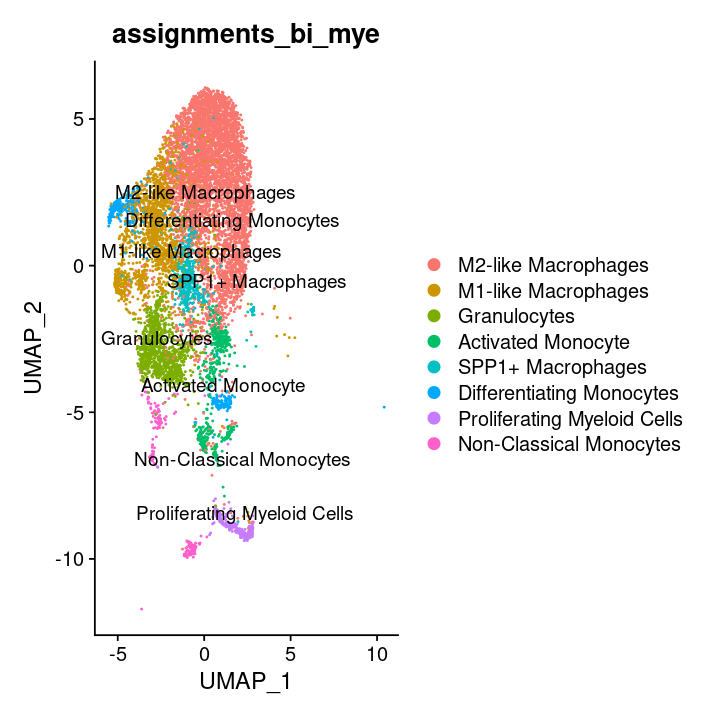

In [21]:
options(repr.plot.width=12, repr.plot.height=12)


assignments_k_mye <- c(
"Macrophages",
"Macrophages",
"Monocytes",
"Macrophages",
"Macrophages",
"Monocytes",
"Macrophages",
"Macrophages",
"Macrophages",
"Poliferating Macrophages",
"DCs",
"Macrophages",
"Mast Cells",
"DCs")

assignments_bi_mye <- c(
'M2-like Macrophages',
'M2-like Macrophages',
'T-cell doublets',
'M1-like Macrophages',
'Granulocytes',
'Activated Monocyte',
'SPP1+ Macrophages',
'M1-like Macrophages',
'Differentiating Monocytes',
'Proliferating Myeloid Cells',
'T-cell Doublets',
'Non-Classical Monocytes',
'Mast Cells',
'LAMP3+ Dendritic Cells'
)

myeloid@meta.data[["subclusters"]] <- Idents(myeloid)
nm <- setNames(assignments_k_mye, levels(Idents(myeloid)))
myeloid <- RenameIdents(myeloid, nm)
myeloid@meta.data[["assignments_k_mye"]] <- Idents(object = myeloid) 
Idents(object = myeloid) <- "subclusters"

myeloid@meta.data[["subclusters"]] <- Idents(myeloid)
nm <- setNames(assignments_bi_mye, levels(Idents(myeloid)))
myeloid <- RenameIdents(myeloid, nm)
myeloid@meta.data[["assignments_bi_mye"]] <- Idents(object = myeloid) 
Idents(object = myeloid) <- "subclusters"


macrophages <- subset(myeloid, idents = c(0,1,3,4,5,6,7,8,9,11))
options(repr.plot.width=6, repr.plot.height=6)

DimPlot(object = macrophages, reduction = 'umap',group.by = "assignments_bi_mye", label = TRUE, repel = TRUE)


In [26]:
 !Idents(macrophages) == "Non-Classical Monocytes"

[1]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [13]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [25]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [37]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [49]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [61]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [73]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [85]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
  [97]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [109]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [121]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [133]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [145]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [157]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [169]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [181]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [193]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [205]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [217]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [229]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [241]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [253]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [265]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [277]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [289]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [301]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [313]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [325]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [337]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [349]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [361]  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [373]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [385]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [397]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [409]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [421]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE
 [433]  TRUE  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [445]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [457]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [469]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [481]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [493]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [505]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [517]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [529]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [541]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [553]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [565]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [577]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [589]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [601]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRU

In [25]:
Idents(macrophages) <- 'assignments_bi_mye'


ERROR: Error in FetchData.Seurat(object = object, vars = unique(x = expr.char[vars.use]), : None of the requested variables were found: 


In [34]:
dm_macrophages <- subset(macrophages, subset = assignments_bi_mye != "Non-Classical Monocytes")




DefaultAssay(dm_macrophages) <- "integrated"

dm_myeloid_seu <- as.SingleCellExperiment(dm_macrophages)
dm_myeloid_seu_dm <- DiffusionMap(dm_myeloid_seu, verbose = TRUE, n_pcs = 25)
saveRDS(dm_myeloid_seu_dm, "DiffusionAnalysisData/Integrated_BI_Myeloid_V2_DM_obj_25.rds")
write.csv(dm_myeloid_seu_dm@eigenvectors, "DiffusionAnalysisData/Integrated_BI_Myeloid_DM_V2_obj_25_eigenvectors.csv")



finding knns......done. Time: 28.01s
Calculating transition probabilities...

Warning message:
"as(<dsCMatrix>, "dsTMatrix") is deprecated since Matrix 1.5-0; do as(., "TsparseMatrix") instead"


...done. Time: 0.25s

performing eigen decomposition......done. Time: 0.83s


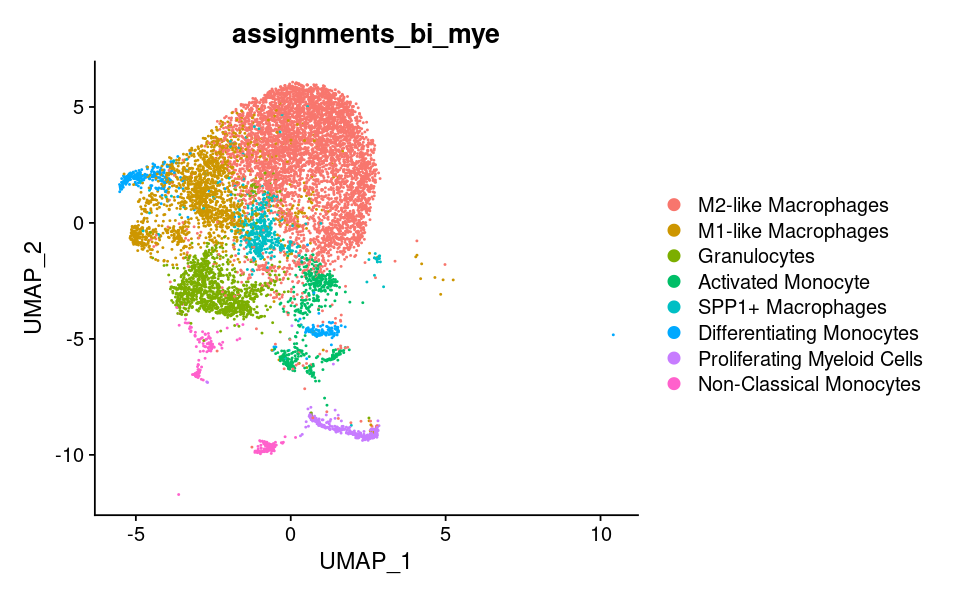

In [32]:
options(repr.plot.width = 8, repr.plot.height=5)
DimPlot(object = macrophages, reduction = 'umap',group.by = "assignments_bi_mye", repel = TRUE)


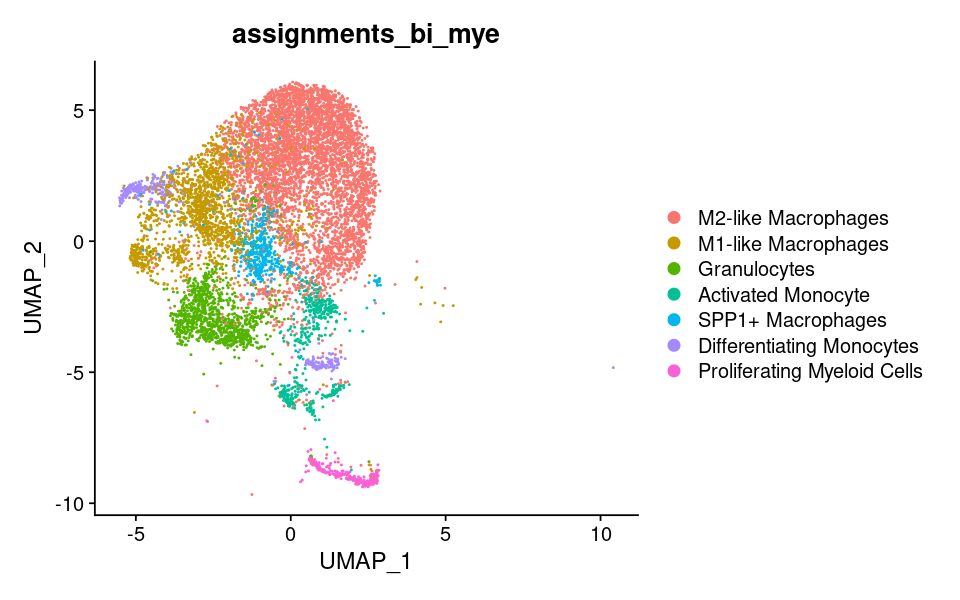

In [33]:
options(repr.plot.width = 8, repr.plot.height=5)
DimPlot(object = dm_macrophages, reduction = 'umap',group.by = "assignments_bi_mye", repel = TRUE)


In [23]:
assignments_k_macro <- c("M2A", "M2A","M2C/M2A", "M1", "M2D","M1", "M2C", "M1")
macrophages@meta.data[["subclusters"]] <- Idents(macrophages)
nm <- setNames(assignments_k_macro, levels(Idents(macrophages)))
macrophages <- RenameIdents(macrophages, nm)
macrophages@meta.data[["assignments_k"]] <- Idents(object = macrophages) 
Idents(object = macrophages) <- "subclusters"

DimPlot(object = macrophages , group.by= 'assignments_k', reduction = 'umap', label = TRUE, repel = TRUE)


ERROR: Error in names(object) <- nm: 'names' attribute [10] must be the same length as the vector [8]


In [106]:
assignments_k_mye <- c(
"Macrophages",
"Macrophages",
"Monocytes",
"Macrophages",
"Macrophages",
"Monocytes",
"Macrophages",
"Macrophages",
"Macrophages",
"Poliferating Macrophages",
"DCs",
"Macrophages",
"Mast Cells",
"DCs")

myeloid@meta.data[["subclusters"]] <- Idents(myeloid)
nm <- setNames(assignments_k_mye, levels(Idents(myeloid)))
myeloid <- RenameIdents(myeloid, nm)
myeloid@meta.data[["assignments_k_mye"]] <- Idents(object = myeloid) 
Idents(object = myeloid) <- "subclusters"


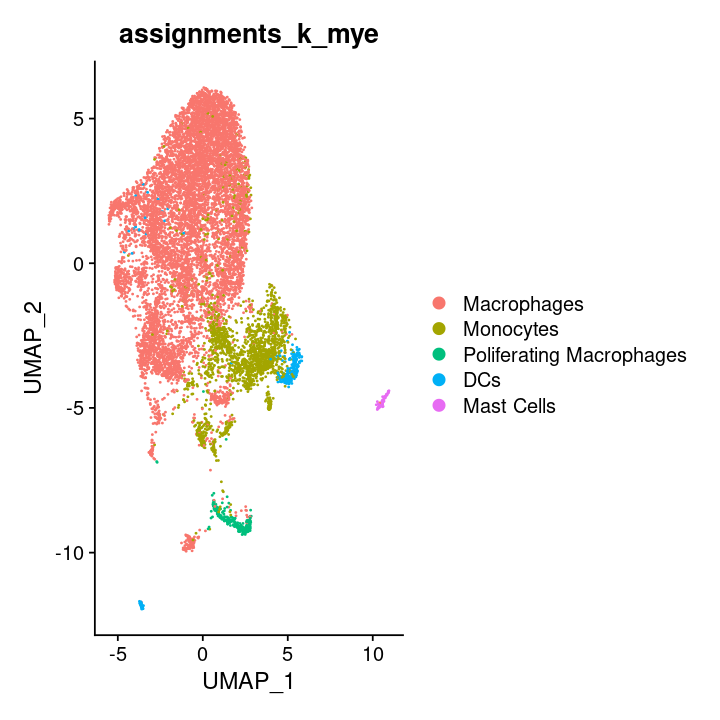

In [107]:
DimPlot(object = myeloid , group.by= c('assignments_k_mye'), reduction = 'umap', label = FALSE, repel = TRUE)


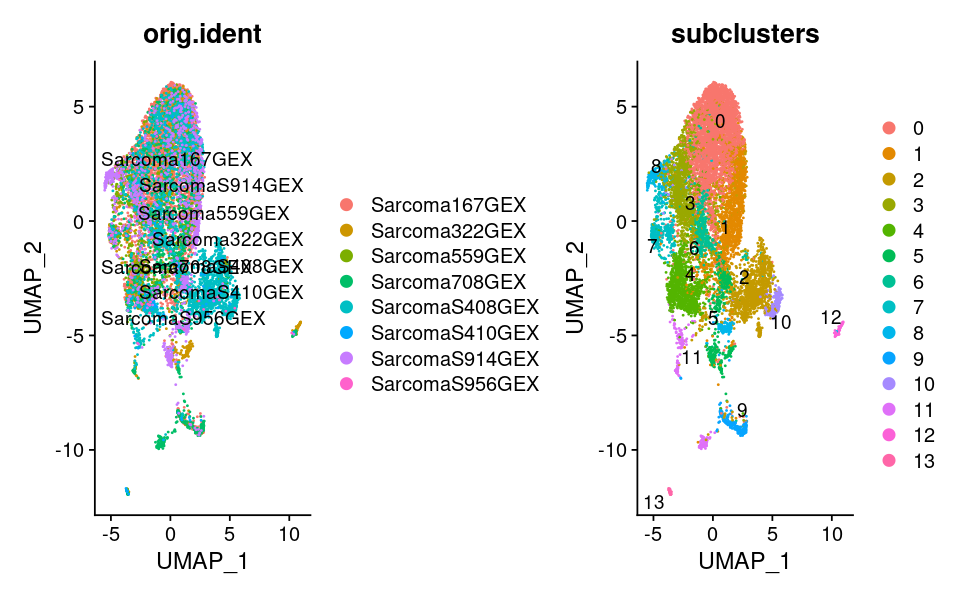

In [98]:
DimPlot(object = myeloid , group.by= c('orig.ident', 'subclusters'), reduction = 'umap', label = TRUE, repel = TRUE)


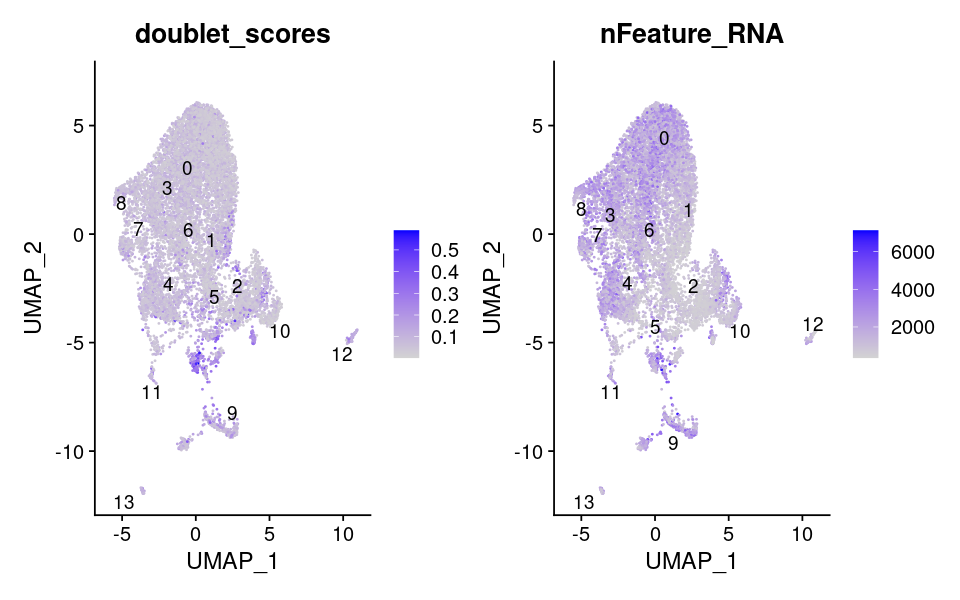

In [99]:
FeaturePlot(object = myeloid , features= c('doublet_scores', 'nFeature_RNA'), 
            reduction = 'umap', label = TRUE, repel = TRUE)


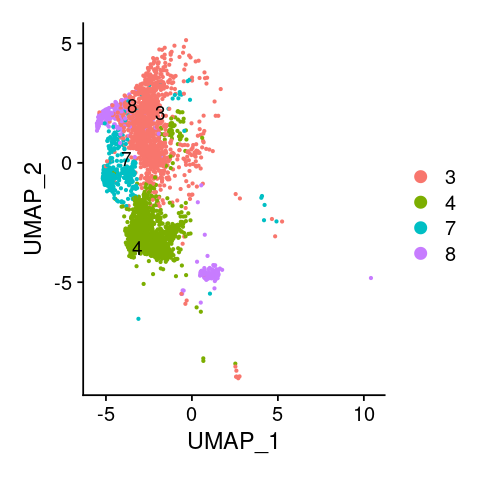

In [337]:
options(repr.plot.width=4, repr.plot.height=4)

DimPlot(object = subset(myeloid, idents = c(8,7,3,4)) , reduction = 'umap', label = TRUE, repel = TRUE)


In [ ]:
FeaturePlot(object = subset(tcell, idents = c(0, 1,4, 15)) , features ='CD8..Tex1' )


In [486]:
myeloid_markers<- FindAllMarkers(myeloid) 
write.csv(myeloid_markers, "res05_all_myeloid_markers.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13



In [110]:
dm_myeloid <- subset(myeloid, idents = c(0,1,2,3,4,5,6,7,8))

dm_myeloid_assignments <- c("M2A", "M2A","Monoctye", "M2C/M2A", "M1", "Monoctye","M2D","M1", "M2C")
dm_myeloid@meta.data[["subclusters"]] <- Idents(dm_myeloid)
nm <- setNames(dm_myeloid_assignments, levels(Idents(dm_myeloid)))
dm_myeloid <- RenameIdents(dm_myeloid, nm)
dm_myeloid@meta.data[["assignments_k"]] <- Idents(object = dm_myeloid) 
Idents(object = dm_myeloid) <- "subclusters"





In [115]:
dm_myeloid

An object of class Seurat 
37091 features across 10281 samples within 2 assays 
Active assay: RNA (35091 features, 0 variable features)
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [142]:
dm_myeloid <- subset(myeloid, idents = c(0,1,3,4,5,6,7,8,9,11))

DefaultAssay(dm_myeloid) <- "integrated"

dm_myeloid_seu <- as.SingleCellExperiment(dm_myeloid)
dm_myeloid_seu_dm <- DiffusionMap(dm_myeloid_seu, verbose = TRUE, n_pcs = 25)
saveRDS(dm_myeloid_seu_dm, "DiffusionAnalysisData/Integrated_BI_Myeloid_DM_obj_25.rds")
write.csv(dm_myeloid_seu_dm@eigenvectors, "DiffusionAnalysisData/Integrated_BI_Myeloid_DM_obj_25_eigenvectors.csv")


finding knns......done. Time: 32.06s
Calculating transition probabilities......done. Time: 0.17s

performing eigen decomposition......done. Time: 0.59s


In [143]:
SaveH5Seurat(dm_myeloid, filename = "DiffusionAnalysisData/BI_Myeloid_DM_obj.h5Seurat")
Convert("DiffusionAnalysisData/BI_Myeloid_DM_obj.h5Seurat", dest = "h5ad")
write.csv(dm_myeloid@meta.data, "DiffusionAnalysisData/BI_Myeloid_DM_obj.csv")

Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding data for integrated

Adding scale.data for integrated

Adding variable features for integrated

No feature-level metadata found for integrated

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap

No loadings for umap

No projected loadings for umap

No standard deviations for umap

No JackStraw data for umap

Validating h5Seurat file

Adding scale.data from integrated as X

Adding data from integrated as raw

Transfering meta.data to obs

Adding dimensional reduction information for pca

Adding feature loadings for pca

Adding dimensional reduction information for umap



In [20]:
non_tumor.markers.res.0.2<- FindAllMarkers(seu) 

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13



In [21]:
#write.csv(non_tumor.markers.res.0.2, "res02_all_non_malig_cell_markers.csv")

In [6]:
ben_assignments <- readRDS("../non_malignant_cells_with_assignment_ben.rds")

In [13]:
cbind.fill<-function(...){
    nm <- list(...) 
    nm<-lapply(nm, as.matrix)
    n <- max(sapply(nm, nrow)) 
    do.call(cbind, lapply(nm, function (x) 
    rbind(x, matrix(, n-nrow(x), ncol(x))))) 
}
allData <- cbind.fill(seu@meta.data, ben_cell_type = ben_assignments$cell_type)


In [15]:
seu@meta.data$ben_prev_assignment <- as.data.frame(allData)$V49

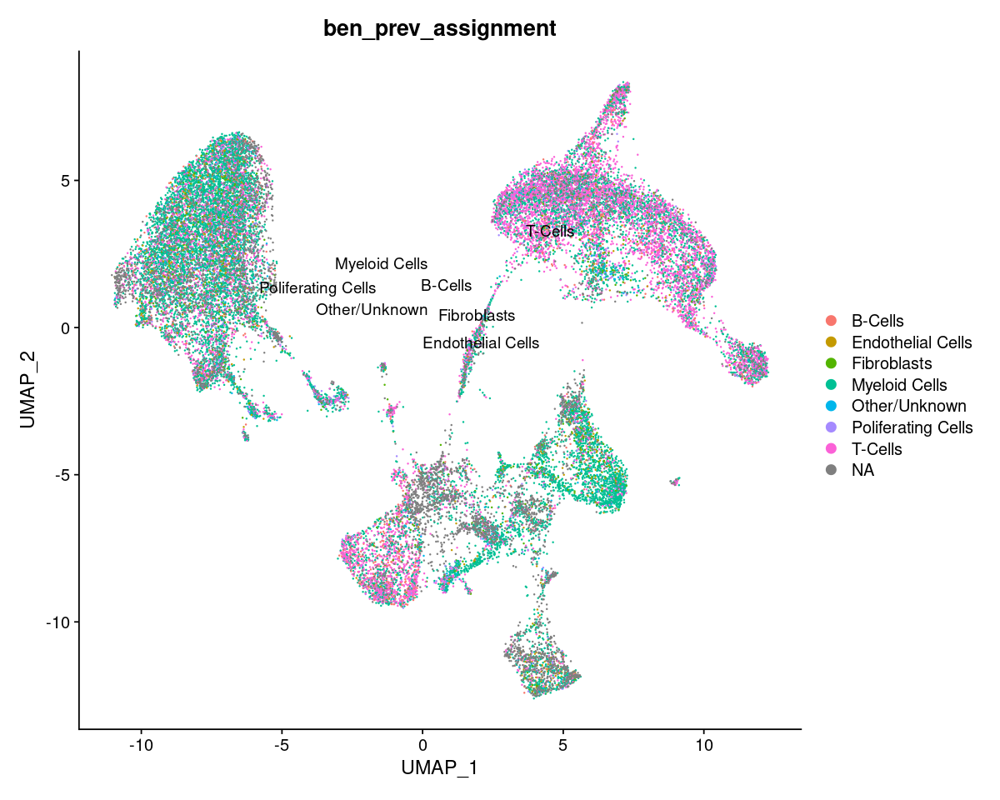

In [18]:
options(repr.plot.width=10, repr.plot.height=8)

DimPlot(object = seu, reduction = 'umap',group.by="ben_prev_assignment", label = TRUE, repel = TRUE)


In [194]:
minFeature <- 300
minCount <- 600
downsampled <- FALSE
base_dir <- 'CellRanger/'


pat_list <- c('Sarcoma167GEX', 'Sarcoma322GEX', 'Sarcoma559GEX', 'Sarcoma708GEX', 'SarcomaS408GEX', 'SarcomaS410GEX', 'SarcomaS914GEX', 'SarcomaS956GEX')


object.list <- lapply(pat_list, function (x) readRDS(paste0("~/CompiledData/data/", x, "/data_", 
                                        x, "_genes_", minFeature, '_UMI_', minCount, '_annotated_for_infercnv.rds')))


In [195]:
pat_list <- c('Sarcoma167GEX', 'Sarcoma322GEX', 'Sarcoma559GEX', 'Sarcoma708GEX', 'SarcomaS408GEX', 'SarcomaS410GEX', 'SarcomaS914GEX', 'SarcomaS956GEX')

# merge datasets without normalizing again
seu_merged_all <- merge(object.list[[1]], y = object.list[2:8], add.cell.ids = pat_list,
                    project = 'sarcoma_merged', merge.data = TRUE)

In [196]:
seu_merged_all <- NormalizeData(seu_merged_all, verbose = FALSE)
seu_merged_all <- FindVariableFeatures(seu_merged_all, verbose = FALSE)
seu_merged_all <- ScaleData(object = seu_merged_all)
seu_merged_all <- RunPCA(object = seu_merged_all)
seu_merged_all <- FindNeighbors(seu_merged_all, dims = 1:30)
seu_merged_all <- FindClusters(seu_merged_all)
seu_merged_all <- RunUMAP(object = seu_merged_all, dims = 1:30)

Centering and scaling data matrix

PC_ 1 
Positive:  AOAH, CD74, RGS1, SAMSN1, HLA-DRB1, FTL, SRGN, ST6GAL1, CYTIP, PDE3B 
	   SKAP1, HLA-DRA, CD163, F13A1, RBM47, MS4A6A, MRC1, STAB1, CYBB, MS4A7 
	   C1QC, HLA-DPA1, HSP90AA1, C1QB, THEMIS, FCGR2A, TSC22D3, SEL1L3, DUSP1, C1QA 
Negative:  SULF1, SEMA5A, CCDC102B, EDNRA, EPS8, AC083967.1, AC011246.1, DGKB, CASC15, RERG 
	   GUCY1B1, MSC-AS1, CCDC144NL-AS1, AC024901.1, GUCY1A1, PDE3A, AC107223.1, ABCC9, IL1RAPL1, AL008633.1 
	   CYP7B1, HPSE2, TMEM108, SGIP1, CACNA1C, PTPRT, HECW2, DCLK2, SYNPO2, SLC24A3 
PC_ 2 
Positive:  LINC00922, RFX8, TENM3, AC007091.1, AC092957.1, ALDH1A2, LINC00871, AC015574.1, AC090125.1, MME 
	   GREM1, VEGFC, KCNJ15, TENM2, NUF2, AC011287.1, AC139493.2, GJA1, LINC01705, KNL1 
	   MIR548XHG, HS3ST3A1, FGF5, DIAPH3, GPR176, NAV3, RRM2, ASPM, WNT5B, LTBP1 
Negative:  PPP2R2B, AKAP6, NKAIN2, ST18, CADM2, IL1RAPL1, NPAS3, CNTNAP4, PLCL1, SLC24A2 
	   DNAJC6, CTNNA3, CNDP1, PCSK6, ERBB4, ADGRB3, SLAIN1, CTNND2, LRP1

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 75716
Number of edges: 2776890

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9377
Number of communities: 37
Elapsed time: 23 seconds


09:23:57 UMAP embedding parameters a = 0.9922 b = 1.112

09:23:57 Read 75716 rows and found 30 numeric columns

09:23:57 Using Annoy for neighbor search, n_neighbors = 30

09:23:57 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:24:09 Writing NN index file to temp file /tmp/Rtmp70T1LH/file6806bcee9fa

09:24:09 Searching Annoy index using 1 thread, search_k = 3000

09:24:38 Annoy recall = 100%

09:24:39 Commencing smooth kNN distance calibration using 1 thread

09:24:43 Initializing from normalized Laplacian + noise

09:24:57 Commencing optimization for 200 epochs, with 3389608 positive edges

09:25:38 Optimization finished



In [198]:
seu_merged_all@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,doublet_scores,RNA_snn_res.0.8,seurat_clusters,old.ident,celltype_
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<dbl>,<fct>,<fct>,<chr>,<chr>
Sarcoma167GEX_GATTCAGAGCCGATTT-1,Sarcoma167GEX,39853,7432,0.63483301,0.10287808,0.055202871,0.15808095,Sarcoma167GEX,Pericytes,FALSE,0.11380786,2,2,6,Fibroblasts
Sarcoma167GEX_ATCGAGTGTGCTTCTC-1,Sarcoma167GEX,39700,6956,2.20403023,0.09823678,0.118387909,0.21662469,Sarcoma167GEX,Smooth muscle,FALSE,0.07675208,2,2,5,Fibroblasts
Sarcoma167GEX_CTAGAGTGTTCCCGAG-1,Sarcoma167GEX,39610,7439,1.52486746,0.05301691,0.035344610,0.08836152,Sarcoma167GEX,Smooth muscle,FALSE,0.08957534,2,2,6,Fibroblasts
Sarcoma167GEX_TCTGAGACAATCCAAC-1,Sarcoma167GEX,39277,7151,0.04582835,0.09929475,0.040736309,0.14003106,Sarcoma167GEX,Pericytes,FALSE,0.07975537,2,2,5,Fibroblasts
Sarcoma167GEX_GCATGATAGTGACTCT-1,Sarcoma167GEX,39329,7417,0.74245468,0.05848102,0.020341224,0.07882224,Sarcoma167GEX,Smooth muscle,FALSE,0.09499930,2,2,7,Fibroblasts
Sarcoma167GEX_GAACCTAGTTTCCACC-1,Sarcoma167GEX,38867,7379,2.45195153,0.15179973,0.187820002,0.33961973,Sarcoma167GEX,Pericytes,FALSE,0.09499930,2,2,6,Fibroblasts
Sarcoma167GEX_CATCAGAAGCTTTGGT-1,Sarcoma167GEX,38875,7188,1.56913183,0.09260450,0.028295820,0.12090032,Sarcoma167GEX,Smooth muscle,FALSE,0.08957534,2,2,5,Fibroblasts
Sarcoma167GEX_GTTCGGGCACAGACAG-1,Sarcoma167GEX,38621,7399,0.44535356,0.10357060,0.111338391,0.21490899,Sarcoma167GEX,Smooth muscle,FALSE,0.09883058,2,2,7,Fibroblasts
Sarcoma167GEX_CATGCCTTCCAAATGC-1,Sarcoma167GEX,38183,7046,1.91970249,0.16499489,0.185946625,0.35094152,Sarcoma167GEX,Smooth muscle,FALSE,0.07675208,2,2,5,Fibroblasts


In [199]:
library("stringr")

new_cell_names <- c()
for (x in rownames(seu_merged_all@meta.data)){

    new_cell_names <- c(new_cell_names, paste0(str_split(x,  "_")[[1]][2], "_" ,
                        match(str_split(x,  "_")[[1]][1],pat_list)))
}
seu_merged_all <- RenameCells(seu_merged_all, new.names =  new_cell_names)


In [203]:
seu_merged_all@meta.data["tcell"] <- rownames(seu_merged_all@meta.data) %in% rownames(tcell@meta.data)
seu_merged_all@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,doublet_scores,RNA_snn_res.0.8,seurat_clusters,old.ident,celltype_,tcell
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<dbl>,<fct>,<fct>,<chr>,<chr>,<lgl>
GATTCAGAGCCGATTT-1_1,Sarcoma167GEX,39853,7432,0.63483301,0.10287808,0.055202871,0.15808095,Sarcoma167GEX,Pericytes,FALSE,0.11380786,2,2,6,Fibroblasts,FALSE
ATCGAGTGTGCTTCTC-1_1,Sarcoma167GEX,39700,6956,2.20403023,0.09823678,0.118387909,0.21662469,Sarcoma167GEX,Smooth muscle,FALSE,0.07675208,2,2,5,Fibroblasts,FALSE
CTAGAGTGTTCCCGAG-1_1,Sarcoma167GEX,39610,7439,1.52486746,0.05301691,0.035344610,0.08836152,Sarcoma167GEX,Smooth muscle,FALSE,0.08957534,2,2,6,Fibroblasts,FALSE
TCTGAGACAATCCAAC-1_1,Sarcoma167GEX,39277,7151,0.04582835,0.09929475,0.040736309,0.14003106,Sarcoma167GEX,Pericytes,FALSE,0.07975537,2,2,5,Fibroblasts,FALSE
GCATGATAGTGACTCT-1_1,Sarcoma167GEX,39329,7417,0.74245468,0.05848102,0.020341224,0.07882224,Sarcoma167GEX,Smooth muscle,FALSE,0.09499930,2,2,7,Fibroblasts,FALSE
GAACCTAGTTTCCACC-1_1,Sarcoma167GEX,38867,7379,2.45195153,0.15179973,0.187820002,0.33961973,Sarcoma167GEX,Pericytes,FALSE,0.09499930,2,2,6,Fibroblasts,FALSE
CATCAGAAGCTTTGGT-1_1,Sarcoma167GEX,38875,7188,1.56913183,0.09260450,0.028295820,0.12090032,Sarcoma167GEX,Smooth muscle,FALSE,0.08957534,2,2,5,Fibroblasts,FALSE
GTTCGGGCACAGACAG-1_1,Sarcoma167GEX,38621,7399,0.44535356,0.10357060,0.111338391,0.21490899,Sarcoma167GEX,Smooth muscle,FALSE,0.09883058,2,2,7,Fibroblasts,FALSE
CATGCCTTCCAAATGC-1_1,Sarcoma167GEX,38183,7046,1.91970249,0.16499489,0.185946625,0.35094152,Sarcoma167GEX,Smooth muscle,FALSE,0.07675208,2,2,5,Fibroblasts,FALSE


In [205]:
unint_tcells<- subset(x = seu_merged_all, subset = tcell == TRUE)
unint_tcells

unint_tcells@meta.data

An object of class Seurat 
35091 features across 9300 samples within 1 assay 
Active assay: RNA (35091 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,percent.rp,patient,celltype_initial_singleR,predicted_doublets,doublet_scores,RNA_snn_res.0.8,seurat_clusters,old.ident,celltype_,tcell
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<dbl>,<fct>,<fct>,<chr>,<chr>,<lgl>
TGCTACCTCTAACCGA-1_1,Sarcoma167GEX,4617,2397,1.5161360,0.02165909,0.06497726,0.08663634,Sarcoma167GEX,CD4+ T-cells,FALSE,0.22855322,20,20,12,Macrophages,TRUE
ATGTGTGCAATGCCAT-1_1,Sarcoma167GEX,4138,2330,2.7791203,0.07249879,0.02416626,0.09666506,Sarcoma167GEX,CD8+ T-cells,FALSE,0.20545049,20,20,12,Macrophages,TRUE
TCGTAGAAGACGCACA-1_1,Sarcoma167GEX,3962,2121,0.8329127,0.17667845,0.02523978,0.20191822,Sarcoma167GEX,CD8+ T-cells,FALSE,0.06975925,30,30,12,Macrophages,TRUE
ACTGAGTCAGACGCCT-1_1,Sarcoma167GEX,3814,1980,1.7304667,0.41950708,0.28841112,0.70791820,Sarcoma167GEX,CD4+ T-cells,FALSE,0.03293977,25,25,11,CD4+ T-cells,TRUE
GCTGCGAGTAACGCGA-1_1,Sarcoma167GEX,3822,1979,2.3286238,0.13082156,0.00000000,0.13082156,Sarcoma167GEX,CD8+ T-cells,FALSE,0.05442425,30,30,12,Macrophages,TRUE
TACGGATTCACTTCAT-1_1,Sarcoma167GEX,3692,1959,0.4604550,0.16251354,0.02708559,0.18959913,Sarcoma167GEX,CD8+ T-cells,FALSE,0.09689240,30,30,12,Macrophages,TRUE
TAGGCATCAAGCTGAG-1_1,Sarcoma167GEX,3697,2001,0.6762240,0.27048959,0.02704896,0.29753854,Sarcoma167GEX,CD8+ T-cells,FALSE,0.05764706,30,30,12,Macrophages,TRUE
CTGTGCTTCACCTCGT-1_1,Sarcoma167GEX,3191,1721,5.3901598,0.31338139,0.18802883,0.50141022,Sarcoma167GEX,CD8+ T-cells,FALSE,0.05989328,0,0,10,CD8+ T-cells,TRUE
CCAATCCGTGCCTGGT-1_1,Sarcoma167GEX,3183,2021,1.7593465,1.25667609,1.28809299,2.54476909,Sarcoma167GEX,CD8+ T-cells,FALSE,0.10284879,0,0,2,Fibroblasts,TRUE


In [ ]:
t_cells_seu <- as.SingleCellExperiment(unint_tcells)
dm_cd8_only_raw <- DiffusionMap(t_cells_seu, verbose = TRUE, n_pcs = 50)
saveRDS(dm_cd8_only_raw, "DiffusionAnalysisData/Unintegrated_T_cell_DM_obj_50.rds")

finding knns...